# scAdam model optimization

Model optimization refers to the process of improving the performance and efficiency of machine learning models. <br>
scAdam models support two types of optimization: <br>

1) <strong>Warm start</strong>: Warm starting is a technique in machine learning that involves initializing a model with weights from a previously trained model on the same or a similar task. <br>
This method allows the training process to begin from a more advantageous point on the loss surface, leveraging prior knowledge to improve efficiency and performance. <br>

2) <strong>Hyperparameter tuning</strong>: This involves adjusting the hyperparameters of the model, such as learning rates, <br>
batch sizes, and other configuration settings, to optimize performance on a specific dataset.


In [1]:
# Python packages
import warnings
warnings.simplefilter('ignore')

import scanpy as sc
import scparadise
import os
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import muon as mu
import anndata

sc.set_figure_params(dpi = 120)

## Recommendations about training dataset 
We recommend shifted logarithm data normalization method: <br>

sc.pp.normalize_total(adata, target_sum=None) <br>

sc.pp.log1p(adata) <br>

But you can use any other method of data normalzation (Use the same normalization method for test dataset) <br>

Training dataset sould contain all genes that you want to use for model training in adata_train.X <br>
We recommend to remove all non-marker genes from adata_train.X (removeing of such useless genes may increase performance and model quality metrics and also increase training speed)

In [2]:
os.chdir('/mnt/c/Users/vadim/scRNA/scParadise/scripts_article')

In [3]:
# Load normalized integrated data
mdata = mu.read_h5mu('PBMC_3p_CITE/human_PBMC_mdata_unintegrated.h5mu')

In [4]:
# Select RNA modality from MuData object (mdata)
adata = mdata.mod['rna'].copy()
del mdata

In [5]:
adata = anndata.AnnData(X = adata.layers['counts'],
                        obs = adata.obs,
                        var = adata.var,
                        obsm = adata.obsm) 

In [6]:
# Create list of samples to leave in reference train dataset
lst_reference_1 = ['P8_0', 'P7_0', 'P2_0', 'P6_0']
# Create list of samples to leave in reference train dataset
lst_reference_2 = ['P1_0', 'P5_0', 'P3_0', 'P4_0']
# Create adata_train_1 and adata_train_2
adata_train_1 = adata[adata.obs['orig.ident'].isin(lst_reference_1)].copy()
adata_train_2 = adata[adata.obs['orig.ident'].isin(lst_reference_2)].copy()

In [7]:
# Create adata_train1, adata_train2 and adata_test datasets
adata_test_1 = adata[adata.obs['orig.ident'].isin(['P1_3', 'P3_3'])].copy()
adata_test_2 = adata[adata.obs['orig.ident'].isin(['P1_7', 'P8_3'])].copy()
adata_test_3 = adata[adata.obs['orig.ident'].isin(['P2_3', 'P4_7'])].copy()
adata_test_4 = adata[adata.obs['orig.ident'].isin(['P2_7', 'P6_3'])].copy()
adata_test_5 = adata[adata.obs['orig.ident'].isin(['P3_7', 'P7_3'])].copy()
adata_test_6 = adata[adata.obs['orig.ident'].isin(['P4_3', 'P7_7'])].copy()
adata_test_7 = adata[adata.obs['orig.ident'].isin(['P5_3', 'P8_7'])].copy()
adata_test_8 = adata[adata.obs['orig.ident'].isin(['P5_7', 'P6_7'])].copy()
#del adata

In [8]:
# Normalize data, find highly variable features
for i in [adata_train_1, adata_train_2, adata_test_1, adata_test_2, adata_test_3, adata_test_4, adata_test_5, adata_test_6, adata_test_7, adata_test_8]:
    i.layers['counts'] = i.X.copy()
    sc.pp.normalize_total(i, target_sum=None)
    sc.pp.log1p(i)
    i.raw = i

In [26]:
# Find genes for model training (marker genes of cell types)
lst_genes = []
annotations = ['celltype_l1', 'celltype_l2', 'celltype_l3'] # annotation levels
for annotation in annotations:
    sc.tl.rank_genes_groups(adata_train_1, 
                            groupby = annotation,
                            method = 't-test_overestim_var', pts = True)
    # Filter marker genes of cell types
    sc.tl.filter_rank_genes_groups(adata_train_1, 
                                   min_fold_change = 1.0, 
                                   min_in_group_fraction = 0.4,
                                   key_added = 'filtered_rank_genes_groups')
    # Create list of genes for model training

    for i in adata.obs[annotation].unique():
        df = sc.get.rank_genes_groups_df(adata_train_1, group = i, key = 'filtered_rank_genes_groups', pval_cutoff = 0.05)
        df['pts_comparizon'] = df['pct_nz_group']/df['pct_nz_reference']
        lst_genes.extend(df.sort_values(by = 'logfoldchanges', ascending = False).head(50)['names'].tolist())
        lst_genes.extend(df.sort_values(by = 'pts_comparizon', ascending = False).head(50)['names'].tolist())
# Remove duplicates 
lst_genes = np.unique(lst_genes).tolist()
len(lst_genes)

842

In [27]:
df_genes = pd.DataFrame(lst_genes, columns = ['genes'])
df_genes.to_csv('PBMC_3p_CITE/genes_for_AI.csv')

In [27]:
# Subset anndata object based on a selected marker genes
genes = pd.read_csv('PBMC_3p_CITE/genes_for_AI.csv')
adata_train_1 = adata_train_1[:, genes.genes].copy()

## Default model training
Use 'balanced_accuracy' as the evaluation metric in this case due to the imbalance in the number of cells among cell types.

In [28]:
adata_train_1_balanced = scparadise.scnoah.balance(adata_train_1, 
                                                   sample='orig.ident',
                                                   celltype_l1='celltype_l1',
                                                   celltype_l2='celltype_l2',
                                                   celltype_l3='celltype_l3')

Successfully undersampled cell types: CD14 Mono, NK, CD4 T Naive, CD8 TEM, CD4 TCM, CD8 T Naive, CD16 Mono

Successfully oversampled cell types: B naive κ, gdT, CD4 TEM, cDC2, B naive λ, CD4 CTL, B memory κ, Treg, CD8 TCM, Platelet, B int λ, B memory λ, MAIT, B int κ, NK_CD56bright, pDC, Plasmablast, dnT, NK Prolif, cDC1, ILC, CD4 T Prolif, HSPC, CD8 T Prolif, ASDC


In [49]:
# Train scadam model using adata_train1 dataset
scparadise.scadam.train(adata_train_1_balanced,
                        path='', # path to save model
                        model_name='model_PBMC_scadam_default', # folder name with model
                        celltype_l1='celltype_l1',
                        celltype_l2='celltype_l2',
                        celltype_l3='celltype_l3',
                        eval_metric=['accuracy'])

Successfully saved genes names for training model

Successfully saved dictionary of dataset annotations

Train dataset contains: 26812 cells, it is 90.0 % of input dataset
Test dataset contains: 2980 cells, it is 10.0 % of input dataset

Accelerator: cuda
Training unsupervised model
epoch 0  | loss: 13.7831 | val_0_unsup_loss_numpy: 1.161520004272461|  0:00:01s
epoch 1  | loss: 1.06488 | val_0_unsup_loss_numpy: 1.003119945526123|  0:00:03s
epoch 2  | loss: 0.99805 | val_0_unsup_loss_numpy: 0.9801300168037415|  0:00:04s
epoch 3  | loss: 0.96048 | val_0_unsup_loss_numpy: 0.9217399954795837|  0:00:06s
epoch 4  | loss: 0.92903 | val_0_unsup_loss_numpy: 0.9057999849319458|  0:00:07s
epoch 5  | loss: 0.91275 | val_0_unsup_loss_numpy: 0.8942599892616272|  0:00:09s
epoch 6  | loss: 0.90194 | val_0_unsup_loss_numpy: 0.878059983253479|  0:00:10s
epoch 7  | loss: 0.88684 | val_0_unsup_loss_numpy: 0.8582199811935425|  0:00:12s
epoch 8  | loss: 0.87373 | val_0_unsup_loss_numpy: 0.8423399925231934| 

### Evaluation of model quality

In [55]:
lst_test_folders = ['P1_3_P3_3', 'P1_7_P8_3', 'P2_3_P4_7', 'P2_7_P6_3', 'P3_7_P7_3', 'P4_3_P7_7', 'P5_3_P8_7', 'P5_7_P6_7']
lst_test_adatas = [adata_test_1, adata_test_2, adata_test_3, adata_test_4, adata_test_5, adata_test_6, adata_test_7, adata_test_8]

In [49]:
# Predict cell types using trained model
for adata_test, j in zip(lst_test_adatas, lst_test_folders):
    os.makedirs(os.path.join('PBMC_3p_CITE/scadam_default', j))
    adata_test = scparadise.scadam.predict(adata_test, 
                                           path_model = 'model_PBMC_scadam_default')
    df_default_l1 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l1',
                                                       pred_celltype='pred_celltype_l1',
                                                       report_name='report_test_scadam_default_' + 'celltype_l1' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_default', j).replace("\\","/"),
                                                       save_report = True)
    
    df_default_l2 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l2',
                                                       pred_celltype='pred_celltype_l2',
                                                       report_name='report_test_scadam_default_' + 'celltype_l2' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_default', j).replace("\\","/"),
                                                       save_report = True)
    
    df_default_l3 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l3',
                                                       pred_celltype='pred_celltype_l3',
                                                       report_name='report_test_scadam_default_' + 'celltype_l3' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_default', j).replace("\\","/"),
                                                       save_report = True)

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities
Successfully saved report

Successfully saved report

Successfully saved report

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities
Successfully saved report

Successfully saved report

Successfully saved report

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

S

In [50]:
adata_test_7 = scparadise.scadam.predict(adata_test_7, 
                                         path_model = 'model_PBMC_scadam_default')
# Order cell type colors
# Celltype_l1
celltype = np.unique(adata_test_7.obs['celltype_l1']).tolist()
adata_test_7.obs['celltype_l1'] = pd.Categorical(
    values=adata_test_7.obs['celltype_l1'], categories=celltype, ordered=True
)
adata_test_7.obs['pred_celltype_l1'] = pd.Categorical(
    values=adata_test_7.obs['pred_celltype_l1'], categories=celltype, ordered=True
)
# Celltype_l2
celltype = np.unique(adata_test_7.obs['celltype_l2']).tolist()
adata_test_7.obs['celltype_l2'] = pd.Categorical(
    values=adata_test_7.obs['celltype_l2'], categories=celltype, ordered=True
)
adata_test_7.obs['pred_celltype_l2'] = pd.Categorical(
    values=adata_test_7.obs['pred_celltype_l2'], categories=celltype, ordered=True
)
# Celltype_l3
celltype = np.unique(adata_test_7.obs['celltype_l3']).tolist()
adata_test_7.obs['celltype_l3'] = pd.Categorical(
    values=adata_test_7.obs['celltype_l3'], categories=celltype, ordered=True
)
adata_test_7.obs['pred_celltype_l3'] = pd.Categorical(
    values=adata_test_7.obs['pred_celltype_l3'], categories=celltype, ordered=True
)
scparadise.scnoah.pred_status(adata_test_7, celltype='celltype_l1', pred_celltype='pred_celltype_l1', key_added='pred_status_l1')
scparadise.scnoah.pred_status(adata_test_7, celltype='celltype_l2', pred_celltype='pred_celltype_l2', key_added='pred_status_l2')
scparadise.scnoah.pred_status(adata_test_7, celltype='celltype_l3', pred_celltype='pred_celltype_l3', key_added='pred_status_l3')

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities


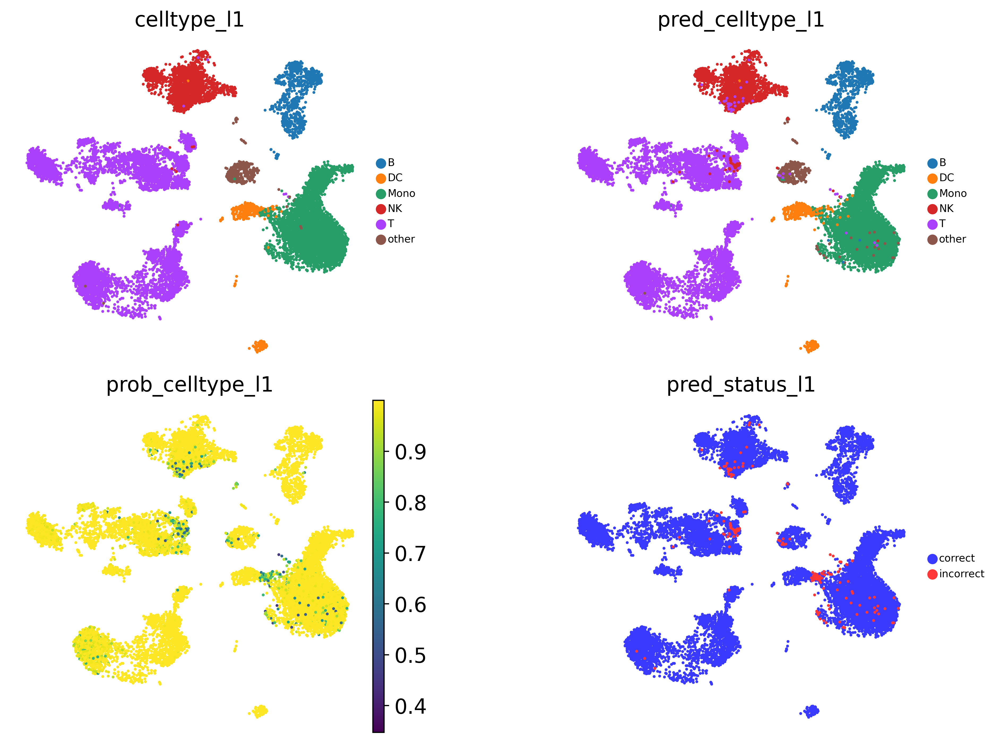

In [31]:
# Visualise predicted cell types levels, prediction probabilities and prediction status
sc.set_figure_params(dpi = 200, dpi_save=600)
adata_test_7 = adata_test_7[adata_test_7.obs['pred_status_l1'].sort_values().index,:]
sc.pl.embedding(adata_test_7, 
                color=[
                    'celltype_l1',
                    'pred_celltype_l1',
                    'prob_celltype_l1',
                    'pred_status_l1'
                ],
                sort_order = False,
                basis = 'X_umap',
                frameon = False,
                add_outline = False,
                legend_loc = 'right margin',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=2,
                s = 15,
                wspace = 0.4, 
                hspace = 0.1,
                save = '_PBMC_celltype_l1_scAdam_default.png')

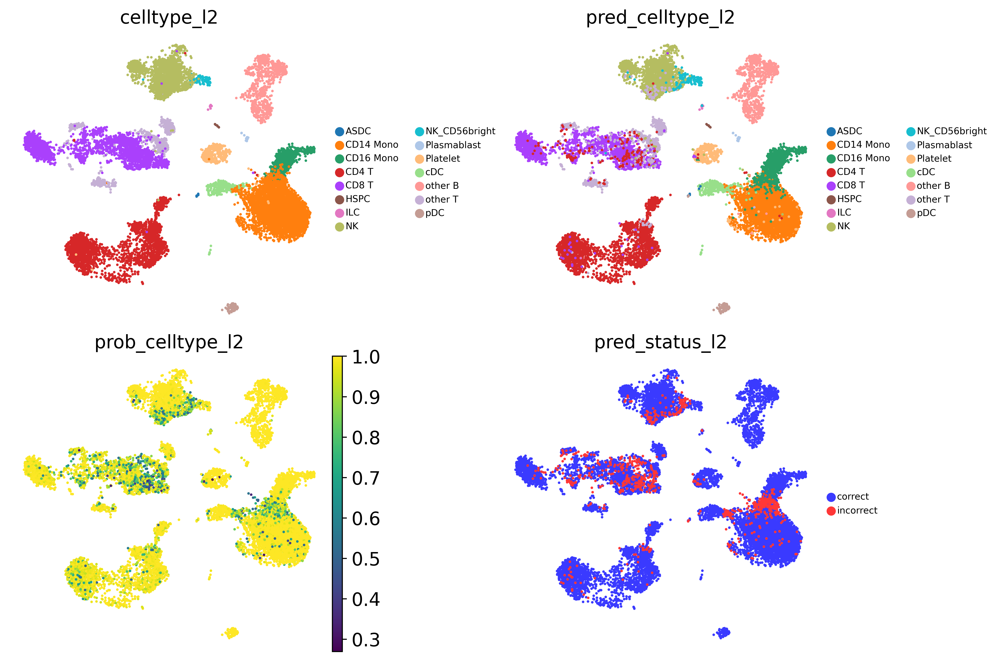

In [32]:
# Visualise predicted cell types levels, prediction probabilities and prediction status
sc.set_figure_params(dpi = 200, dpi_save=600)
adata_test_7 = adata_test_7[adata_test_7.obs['pred_status_l2'].sort_values().index,:]
sc.pl.embedding(adata_test_7, 
                color=[
                    'celltype_l2',
                    'pred_celltype_l2',
                    'prob_celltype_l2',
                    'pred_status_l2'
                ],
                sort_order = False,
                basis = 'X_umap',
                frameon = False,
                add_outline = False,
                legend_loc = 'right margin',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=2,
                s = 15,
                wspace = 0.4, 
                hspace = 0.1,
                save = '_PBMC_celltype_l2_scAdam_default.png')

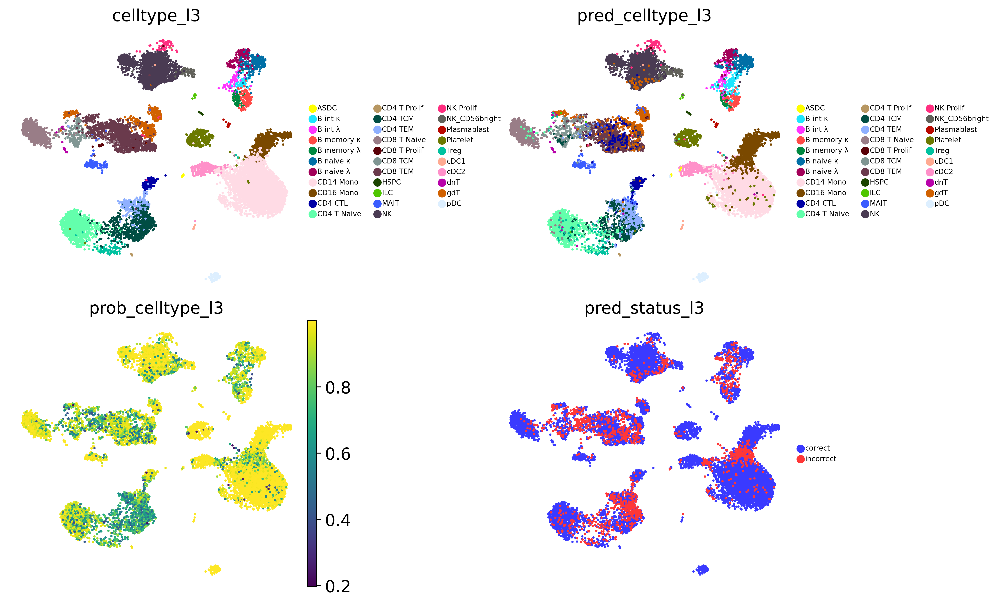

In [51]:
# Visualise predicted cell types levels, prediction probabilities and prediction status
sc.set_figure_params(dpi = 200, dpi_save=600)
adata_test_7 = adata_test_7[adata_test_7.obs['pred_status_l3'].sort_values().index,:]
sc.pl.embedding(adata_test_7, 
                color=[
                    'celltype_l3',
                    'pred_celltype_l3',
                    'prob_celltype_l3',
                    'pred_status_l3'
                ],
                sort_order = False,
                basis = 'X_umap',
                frameon = False,
                add_outline = False,
                legend_loc = 'right margin',
                legend_fontsize = 6,
                legend_fontoutline = 1,
                ncols=2,
                s = 15,
                wspace = 0.5, 
                hspace = 0.1,
                save = '_PBMC_celltype_l3_scAdam_default.png')

## Warm start model training

<div class="alert alert-warning">
<b>Warning!</b>  <br> 
    For warm start scAdam model training, a dataset is required that contains all the same cell types that were present in the original training. <br>
    The cell types must be named exactly as they were during the initial training of the model. <br>

1) There should be no new additional cell types or levels of annotation.

2) Additionally, none of the cell types used for the initial training of the model should be missing.
</div>

In [34]:
adata_train_2_balanced = scparadise.scnoah.balance(adata_train_2, 
                                                   sample='orig.ident',
                                                   celltype_l1='celltype_l1',
                                                   celltype_l2='celltype_l2',
                                                   celltype_l3='celltype_l3')

Successfully undersampled cell types: CD14 Mono, CD4 TCM, CD4 T Naive, NK, CD8 TEM, CD8 T Naive, CD16 Mono

Successfully oversampled cell types: CD4 TEM, MAIT, B naive κ, CD8 TCM, Treg, gdT, cDC2, B naive λ, Platelet, B memory κ, CD4 CTL, B int λ, B int κ, B memory λ, HSPC, pDC, NK_CD56bright, dnT, cDC1, Plasmablast, NK Prolif, ILC, CD4 T Prolif, ASDC, CD8 T Prolif


In [35]:
adata_train_2_balanced.raw = adata_train_2_balanced

In [36]:
# Warm start requires second training dataset and path to pretrained model 
scparadise.scadam.warm_start(adata_train_2_balanced,
                             path='', # path to save model
                             model_name='model_PBMC_scadam_default', # folder name with pretrained model
                             celltype_l1='celltype_l1',
                             celltype_l2='celltype_l2',
                             celltype_l3='celltype_l3',
                             eval_metric=['accuracy'])

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Train dataset contains: 20995 cells, it is 90.0 % of input dataset
Test dataset contains: 2333 cells, it is 10.0 % of input dataset

Successfully loaded parameters

Accelerator: cuda
Start training
epoch 0  | loss: 0.43536 | train_accuracy: 0.9507  | valid_accuracy: 0.94142 |  0:00:02s
epoch 1  | loss: 0.35625 | train_accuracy: 0.9564  | valid_accuracy: 0.94585 |  0:00:04s
epoch 2  | loss: 0.33115 | train_accuracy: 0.96366 | valid_accuracy: 0.95171 |  0:00:06s
epoch 3  | loss: 0.31858 | train_accuracy: 0.9672  | valid_accuracy: 0.95514 |  0:00:08s
epoch 4  | loss: 0.31483 | train_accuracy: 0.96806 | valid_accuracy: 0.95228 |  0:00:10s
epoch 5  | loss: 0.3066  | train_accuracy: 0.96809 | valid_accuracy: 0.95628 |  0:00:12s
epoch 6  | loss: 0.28962 | train_accuracy: 0.96977 | valid_accuracy: 0.95442 |  0:00:14s
epoch 7  | loss: 0.29717 | train_accuracy: 0.97058 | valid_accura

### Evaluation of prediction results

In [59]:
# Predict cell types using trained model
for adata_test, j in zip(lst_test_adatas, lst_test_folders):
    os.makedirs(os.path.join('PBMC_3p_CITE/scadam_warm_start', j))
    adata_test = scparadise.scadam.predict(adata_test, 
                                           path_model = 'model_PBMC_scadam_default')
    df_default_l1 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l1',
                                                       pred_celltype='pred_celltype_l1',
                                                       report_name='report_test_scadam_warm_start_' + 'celltype_l1' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_warm_start', j).replace("\\","/"),
                                                       save_report = True)
    
    df_default_l2 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l2',
                                                       pred_celltype='pred_celltype_l2',
                                                       report_name='report_test_scadam_warm_start_' + 'celltype_l2' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_warm_start', j).replace("\\","/"),
                                                       save_report = True)
    
    df_default_l3 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l3',
                                                       pred_celltype='pred_celltype_l3',
                                                       report_name='report_test_scadam_warm_start_' + 'celltype_l3' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_warm_start', j).replace("\\","/"),
                                                       save_report = True)

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities
Successfully saved report

Successfully saved report

Successfully saved report

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities
Successfully saved report

Successfully saved report

Successfully saved report

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

S

In [37]:
adata_test_7 = scparadise.scadam.predict(adata_test_7, 
                                         path_model = 'model_PBMC_scadam_default')
# Order cell type colors
# Celltype_l1
celltype = np.unique(adata_test_7.obs['celltype_l1']).tolist()
adata_test_7.obs['celltype_l1'] = pd.Categorical(
    values=adata_test_7.obs['celltype_l1'], categories=celltype, ordered=True
)
adata_test_7.obs['pred_celltype_l1'] = pd.Categorical(
    values=adata_test_7.obs['pred_celltype_l1'], categories=celltype, ordered=True
)
# Celltype_l2
celltype = np.unique(adata_test_7.obs['celltype_l2']).tolist()
adata_test_7.obs['celltype_l2'] = pd.Categorical(
    values=adata_test_7.obs['celltype_l2'], categories=celltype, ordered=True
)
adata_test_7.obs['pred_celltype_l2'] = pd.Categorical(
    values=adata_test_7.obs['pred_celltype_l2'], categories=celltype, ordered=True
)
# Celltype_l3
celltype = np.unique(adata_test_7.obs['celltype_l3']).tolist()
adata_test_7.obs['celltype_l3'] = pd.Categorical(
    values=adata_test_7.obs['celltype_l3'], categories=celltype, ordered=True
)
adata_test_7.obs['pred_celltype_l3'] = pd.Categorical(
    values=adata_test_7.obs['pred_celltype_l3'], categories=celltype, ordered=True
)
scparadise.scnoah.pred_status(adata_test_7, celltype='celltype_l1', pred_celltype='pred_celltype_l1', key_added='pred_status_l1')
scparadise.scnoah.pred_status(adata_test_7, celltype='celltype_l2', pred_celltype='pred_celltype_l2', key_added='pred_status_l2')
scparadise.scnoah.pred_status(adata_test_7, celltype='celltype_l3', pred_celltype='pred_celltype_l3', key_added='pred_status_l3')

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities


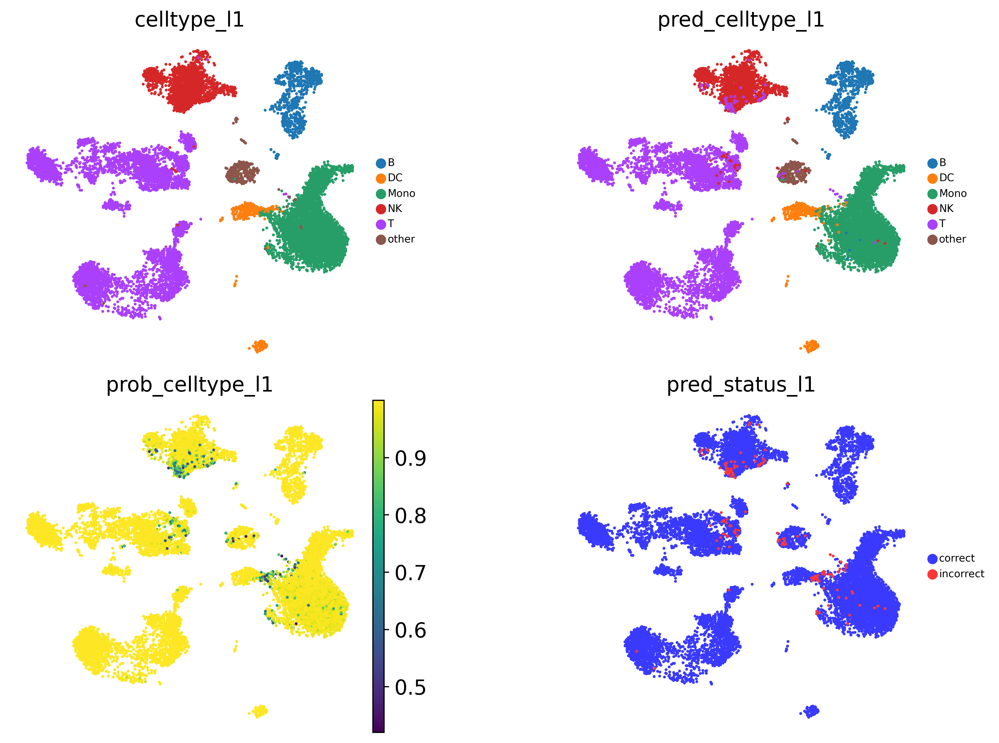

In [38]:
# Visualise predicted cell types levels, prediction probabilities and prediction status
sc.set_figure_params(dpi = 200, dpi_save=600)
adata_test_7 = adata_test_7[adata_test_7.obs['pred_status_l1'].sort_values().index,:]
sc.pl.embedding(adata_test_7, 
                color=[
                    'celltype_l1',
                    'pred_celltype_l1',
                    'prob_celltype_l1',
                    'pred_status_l1'
                ],
                sort_order = False,
                basis = 'X_umap',
                frameon = False,
                add_outline = False,
                legend_loc = 'right margin',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=2,
                s = 15,
                wspace = 0.4, 
                hspace = 0.1,
                save = '_PBMC_celltype_l1_scAdam_warm_start.png')

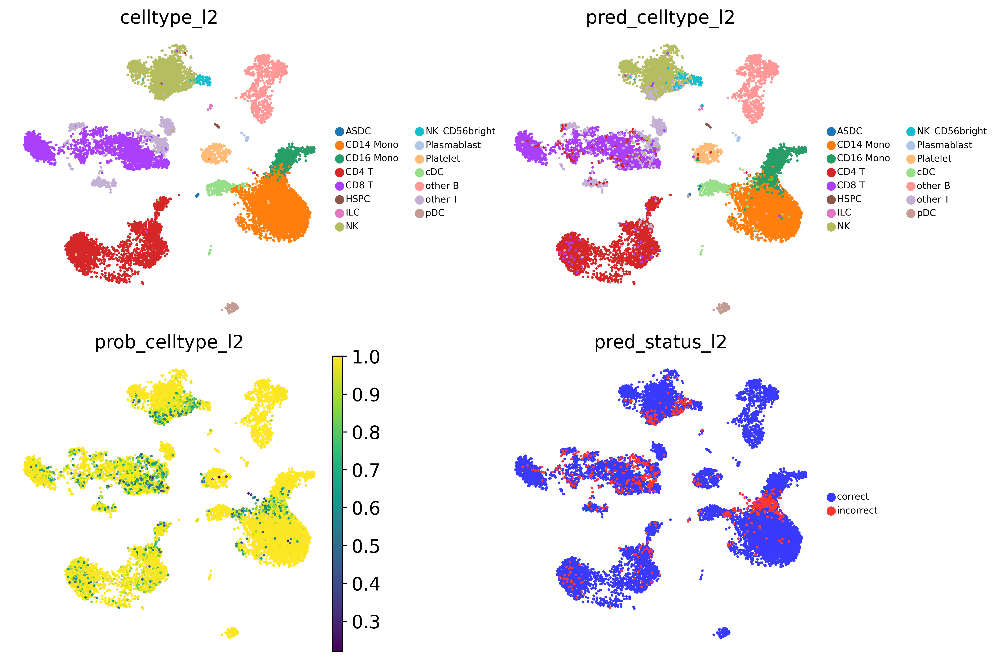

In [39]:
# Visualise predicted cell types levels, prediction probabilities and prediction status
sc.set_figure_params(dpi = 200, dpi_save=600)
adata_test_7 = adata_test_7[adata_test_7.obs['pred_status_l2'].sort_values().index,:]
sc.pl.embedding(adata_test_7, 
                color=[
                    'celltype_l2',
                    'pred_celltype_l2',
                    'prob_celltype_l2',
                    'pred_status_l2'
                ],
                sort_order = False,
                basis = 'X_umap',
                frameon = False,
                add_outline = False,
                legend_loc = 'right margin',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=2,
                s = 15,
                wspace = 0.4, 
                hspace = 0.1,
                save = '_PBMC_celltype_l2_scAdam_warm_start.png')

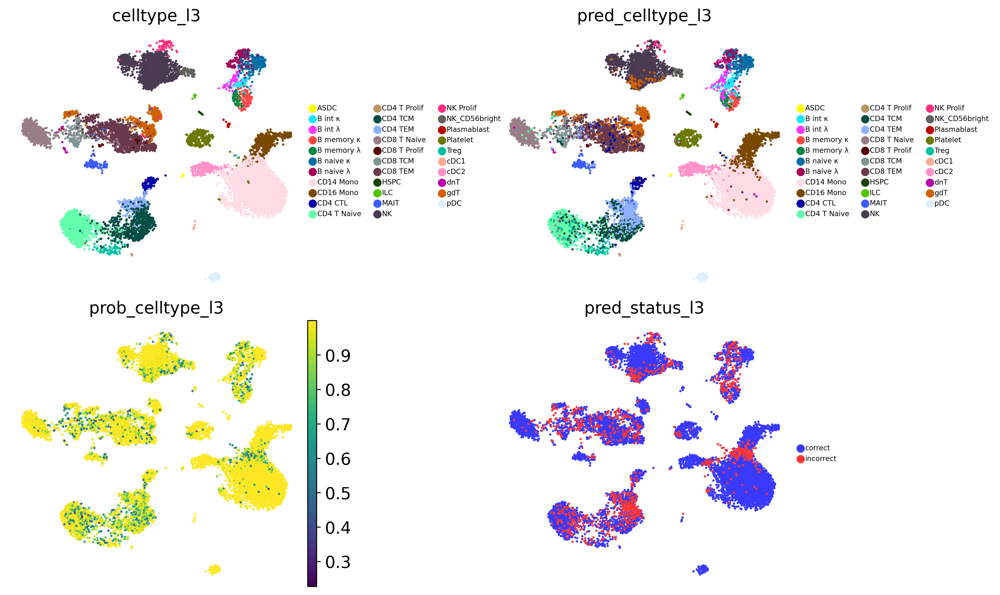

In [48]:
# Visualise predicted cell types levels, prediction probabilities and prediction status
sc.set_figure_params(dpi = 200, dpi_save=600)
adata_test_7 = adata_test_7[adata_test_7.obs['pred_status_l3'].sort_values().index,:]
sc.pl.embedding(adata_test_7, 
                color=[
                    'celltype_l3',
                    'pred_celltype_l3',
                    'prob_celltype_l3',
                    'pred_status_l3'
                ],
                sort_order = False,
                basis = 'X_umap',
                frameon = False,
                add_outline = False,
                legend_loc = 'right margin',
                legend_fontsize = 6,
                legend_fontoutline = 1,
                ncols=2,
                s = 15,
                wspace = 0.5, 
                hspace = 0.1,
                save = '_PBMC_celltype_l3_scAdam_warm_start.png')

## Hyperparameters tuning

<div class="alert alert-warning">
<b>Warning!</b>  <br> 
    Hyperparameter tuning is a very time-consuming process and may be interrupted for various reasons (such as system shutdowns or errors in CUDA). <br> 
    However, this is not a problem, as restarting the hyperparameter tuning will allow it to continue from the last unfinished trial. <br>
    An example of hyperparameter tuning represents such a case. <br>
    The fourth line states: "Using an existing study with name 'model_scadam_hp_tune' instead of creating a new one." <br>
    This indicates a restart of hyperparameter tuning (in this case, from the 8th trial).
</div>

In [51]:
scparadise.scadam.hyperparameter_tuning(adata_train_1_balanced,
                                        path='',
                                        model_name='model_PBMC_scadam__tuning', # Folder to save hyperparameter tuning results
                                        celltype_l1='celltype_l1',
                                        celltype_l2='celltype_l2',
                                        celltype_l3='celltype_l3',
                                        random_state=1,
                                        num_trials=200, # The number of attempts to find the optimal hyperparameters for the model (recommended - minimum 100)
                                        eval_metric=['accuracy'])

Successfully saved genes names for training model

Successfully saved dictionary of dataset annotations

Accelerator: cuda



[I 2025-05-14 14:17:13,237] A new study created in RDB with name: model_PBMC_scadam__tuning


Fold 1:

Early stopping occurred at epoch 85 with best_epoch = 75 and best_valid_accuracy = 0.96487

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.96634

Fold 3:

Early stopping occurred at epoch 93 with best_epoch = 83 and best_valid_accuracy = 0.96666

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.96617


[I 2025-05-14 14:25:29,012] Trial 0 finished with value: 0.9660087719298245 and parameters: {'n_d': 8, 'n_a': 8, 'n_steps': 3, 'n_shared': 2, 'cat_emb_dim': 1, 'n_independent': 1, 'gamma': 1.3, 'momentum': 0.02, 'lr': 0.01, 'mask_type': 'entmax', 'lambda_sparse': 0.001, 'patience': 10, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 0 with value: 0.9660087719298245.



Fold 1:

Early stopping occurred at epoch 34 with best_epoch = 29 and best_valid_accuracy = 0.96898

Fold 2:

Early stopping occurred at epoch 34 with best_epoch = 29 and best_valid_accuracy = 0.96742

Fold 3:

Early stopping occurred at epoch 18 with best_epoch = 13 and best_valid_accuracy = 0.94115

Fold 4:

Early stopping occurred at epoch 25 with best_epoch = 20 and best_valid_accuracy = 0.96603


[I 2025-05-14 14:27:40,594] Trial 1 finished with value: 0.9608955424274973 and parameters: {'n_d': 56, 'n_a': 96, 'n_steps': 1, 'n_shared': 4, 'cat_emb_dim': 2, 'n_independent': 1, 'gamma': 1.1862602113776708, 'momentum': 0.14476868354678862, 'lr': 0.1984440603679119, 'mask_type': 'entmax', 'lambda_sparse': 0.007069470359901731, 'patience': 5, 'max_epochs': 90, 'virtual_batch_size': 256, 'batch_size': 768}. Best is trial 0 with value: 0.9660087719298245.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.94356


[I 2025-05-14 14:32:31,442] Trial 2 pruned. 


Fold 1:

Early stopping occurred at epoch 17 with best_epoch = 12 and best_valid_accuracy = 0.47037


[I 2025-05-14 14:33:25,568] Trial 3 pruned. 


Fold 1:

Early stopping occurred at epoch 60 with best_epoch = 45 and best_valid_accuracy = 0.95927


[I 2025-05-14 14:35:52,373] Trial 4 pruned. 


Fold 1:
Stop training because you reached max_epochs = 65 with best_epoch = 64 and best_valid_accuracy = 0.9642


[I 2025-05-14 14:39:48,924] Trial 5 pruned. 


Fold 1:
Stop training because you reached max_epochs = 70 with best_epoch = 54 and best_valid_accuracy = 0.97189

Fold 2:

Early stopping occurred at epoch 54 with best_epoch = 34 and best_valid_accuracy = 0.97015

Fold 3:
Stop training because you reached max_epochs = 70 with best_epoch = 67 and best_valid_accuracy = 0.97485

Fold 4:
Stop training because you reached max_epochs = 70 with best_epoch = 69 and best_valid_accuracy = 0.96934


[I 2025-05-14 14:49:36,025] Trial 6 finished with value: 0.9715583601861797 and parameters: {'n_d': 36, 'n_a': 120, 'n_steps': 6, 'n_shared': 1, 'cat_emb_dim': 7, 'n_independent': 4, 'gamma': 1.5270581022576093, 'momentum': 0.3555174187312021, 'lr': 0.17869915302524964, 'mask_type': 'entmax', 'lambda_sparse': 0.00011033189053588348, 'patience': 20, 'max_epochs': 70, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 6 with value: 0.9715583601861797.



Fold 1:
Stop training because you reached max_epochs = 85 with best_epoch = 84 and best_valid_accuracy = 0.90015


[I 2025-05-14 14:51:43,056] Trial 7 pruned. 


Fold 1:
Stop training because you reached max_epochs = 25 with best_epoch = 22 and best_valid_accuracy = 0.91694


[I 2025-05-14 14:52:52,836] Trial 8 pruned. 


Fold 1:
Stop training because you reached max_epochs = 5 with best_epoch = 2 and best_valid_accuracy = 0.60638


[I 2025-05-14 14:53:02,627] Trial 9 pruned. 


Fold 1:
Stop training because you reached max_epochs = 40 with best_epoch = 37 and best_valid_accuracy = 0.95923


[I 2025-05-14 14:55:13,932] Trial 10 pruned. 


Fold 1:
Stop training because you reached max_epochs = 70 with best_epoch = 67 and best_valid_accuracy = 0.96299

Fold 2:
Stop training because you reached max_epochs = 70 with best_epoch = 55 and best_valid_accuracy = 0.95994

Fold 3:
Stop training because you reached max_epochs = 70 with best_epoch = 55 and best_valid_accuracy = 0.9548


[I 2025-05-14 15:03:38,529] Trial 11 pruned. 


Fold 1:

Early stopping occurred at epoch 29 with best_epoch = 19 and best_valid_accuracy = 0.9578


[I 2025-05-14 15:05:54,654] Trial 12 pruned. 


Fold 1:

Early stopping occurred at epoch 61 with best_epoch = 51 and best_valid_accuracy = 0.9714

Fold 2:

Early stopping occurred at epoch 47 with best_epoch = 37 and best_valid_accuracy = 0.97082

Fold 3:

Early stopping occurred at epoch 64 with best_epoch = 54 and best_valid_accuracy = 0.97198


[I 2025-05-14 15:09:22,459] Trial 13 pruned. 


Fold 1:
Stop training because you reached max_epochs = 55 with best_epoch = 54 and best_valid_accuracy = 0.8827

Fold 2:
Stop training because you reached max_epochs = 55 with best_epoch = 54 and best_valid_accuracy = 0.82734

Fold 3:
Stop training because you reached max_epochs = 55 with best_epoch = 50 and best_valid_accuracy = 0.74512


[I 2025-05-14 15:11:37,405] Trial 14 pruned. 


Fold 1:

Early stopping occurred at epoch 70 with best_epoch = 55 and best_valid_accuracy = 0.9697

Fold 2:

Early stopping occurred at epoch 80 with best_epoch = 65 and best_valid_accuracy = 0.9701

Fold 3:

Early stopping occurred at epoch 80 with best_epoch = 65 and best_valid_accuracy = 0.97283

Fold 4:

Early stopping occurred at epoch 41 with best_epoch = 26 and best_valid_accuracy = 0.97019


[I 2025-05-14 15:22:54,462] Trial 15 finished with value: 0.9707080200501254 and parameters: {'n_d': 100, 'n_a': 72, 'n_steps': 5, 'n_shared': 2, 'cat_emb_dim': 8, 'n_independent': 5, 'gamma': 1.3975948015336448, 'momentum': 0.3047999899341775, 'lr': 0.21345943960987734, 'mask_type': 'entmax', 'lambda_sparse': 0.0016842811410782937, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 896}. Best is trial 6 with value: 0.9715583601861797.



Fold 1:

Early stopping occurred at epoch 58 with best_epoch = 38 and best_valid_accuracy = 0.96764

Fold 2:
Stop training because you reached max_epochs = 80 with best_epoch = 62 and best_valid_accuracy = 0.96634

Fold 3:
Stop training because you reached max_epochs = 80 with best_epoch = 73 and best_valid_accuracy = 0.96916


[I 2025-05-14 15:35:18,948] Trial 16 pruned. 


Fold 1:

Early stopping occurred at epoch 54 with best_epoch = 39 and best_valid_accuracy = 0.83812

Fold 2:
Stop training because you reached max_epochs = 60 with best_epoch = 56 and best_valid_accuracy = 0.9445

Fold 3:

Early stopping occurred at epoch 53 with best_epoch = 38 and best_valid_accuracy = 0.89711


[I 2025-05-14 15:45:58,626] Trial 17 pruned. 


Fold 1:
Stop training because you reached max_epochs = 30 with best_epoch = 26 and best_valid_accuracy = 0.70332

Fold 2:
Stop training because you reached max_epochs = 30 with best_epoch = 29 and best_valid_accuracy = 0.68188

Fold 3:
Stop training because you reached max_epochs = 30 with best_epoch = 27 and best_valid_accuracy = 0.67128


[I 2025-05-14 15:48:05,516] Trial 18 pruned. 


Fold 1:

Early stopping occurred at epoch 40 with best_epoch = 25 and best_valid_accuracy = 0.95874


[I 2025-05-14 15:50:47,748] Trial 19 pruned. 


Fold 1:
Stop training because you reached max_epochs = 45 with best_epoch = 29 and best_valid_accuracy = 0.959


[I 2025-05-14 15:52:25,616] Trial 20 pruned. 


Fold 1:

Early stopping occurred at epoch 55 with best_epoch = 45 and best_valid_accuracy = 0.97109

Fold 2:

Early stopping occurred at epoch 41 with best_epoch = 31 and best_valid_accuracy = 0.97064

Fold 3:

Early stopping occurred at epoch 44 with best_epoch = 34 and best_valid_accuracy = 0.97185


[I 2025-05-14 15:56:05,834] Trial 21 pruned. 


Fold 1:

Early stopping occurred at epoch 51 with best_epoch = 41 and best_valid_accuracy = 0.93712


[I 2025-05-14 15:58:41,893] Trial 22 pruned. 


Fold 1:

Early stopping occurred at epoch 51 with best_epoch = 36 and best_valid_accuracy = 0.97051

Fold 2:

Early stopping occurred at epoch 64 with best_epoch = 49 and best_valid_accuracy = 0.974

Fold 3:

Early stopping occurred at epoch 53 with best_epoch = 38 and best_valid_accuracy = 0.9718


[I 2025-05-14 16:09:58,059] Trial 23 pruned. 


Fold 1:

Early stopping occurred at epoch 69 with best_epoch = 59 and best_valid_accuracy = 0.9748

Fold 2:

Early stopping occurred at epoch 65 with best_epoch = 55 and best_valid_accuracy = 0.97547

Fold 3:

Early stopping occurred at epoch 37 with best_epoch = 27 and best_valid_accuracy = 0.9727

Fold 4:

Early stopping occurred at epoch 45 with best_epoch = 35 and best_valid_accuracy = 0.97337


[I 2025-05-14 16:17:26,118] Trial 24 finished with value: 0.9740870032223415 and parameters: {'n_d': 108, 'n_a': 88, 'n_steps': 2, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 7, 'gamma': 1.643924385982628, 'momentum': 0.18587382934959873, 'lr': 0.07316850082578213, 'mask_type': 'entmax', 'lambda_sparse': 0.0013251821306722832, 'patience': 10, 'max_epochs': 90, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 24 with value: 0.9740870032223415.



Fold 1:

Early stopping occurred at epoch 81 with best_epoch = 66 and best_valid_accuracy = 0.97297

Fold 2:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.9761

Fold 3:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.9757

Fold 4:
Stop training because you reached max_epochs = 90 with best_epoch = 89 and best_valid_accuracy = 0.97713


[I 2025-05-14 16:35:08,244] Trial 25 finished with value: 0.9754744002864304 and parameters: {'n_d': 112, 'n_a': 88, 'n_steps': 7, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 7, 'gamma': 1.6449239015856876, 'momentum': 0.18213545180659926, 'lr': 0.08441897439923854, 'mask_type': 'entmax', 'lambda_sparse': 0.013599934579054725, 'patience': 15, 'max_epochs': 90, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 85 with best_epoch = 77 and best_valid_accuracy = 0.97104

Fold 2:

Early stopping occurred at epoch 70 with best_epoch = 60 and best_valid_accuracy = 0.97355

Fold 3:

Early stopping occurred at epoch 72 with best_epoch = 62 and best_valid_accuracy = 0.97467

Fold 4:

Early stopping occurred at epoch 73 with best_epoch = 63 and best_valid_accuracy = 0.97516


[I 2025-05-14 16:46:17,197] Trial 26 finished with value: 0.9736058897243108 and parameters: {'n_d': 116, 'n_a': 88, 'n_steps': 7, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 10, 'gamma': 1.6181970357457174, 'momentum': 0.17982153630484615, 'lr': 0.07282229546412294, 'mask_type': 'entmax', 'lambda_sparse': 0.014019493158396542, 'patience': 10, 'max_epochs': 85, 'virtual_batch_size': 512, 'batch_size': 1536}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 85 with best_epoch = 80 and best_valid_accuracy = 0.97234

Fold 2:

Early stopping occurred at epoch 63 with best_epoch = 53 and best_valid_accuracy = 0.97324

Fold 3:

Early stopping occurred at epoch 78 with best_epoch = 68 and best_valid_accuracy = 0.97221


[I 2025-05-14 16:55:32,265] Trial 27 pruned. 


Fold 1:

Early stopping occurred at epoch 59 with best_epoch = 49 and best_valid_accuracy = 0.97109

Fold 2:

Early stopping occurred at epoch 70 with best_epoch = 60 and best_valid_accuracy = 0.97073

Fold 3:

Early stopping occurred at epoch 66 with best_epoch = 56 and best_valid_accuracy = 0.97306

Fold 4:

Early stopping occurred at epoch 68 with best_epoch = 58 and best_valid_accuracy = 0.96925


[I 2025-05-14 17:05:49,521] Trial 28 finished with value: 0.9710324919441461 and parameters: {'n_d': 116, 'n_a': 92, 'n_steps': 7, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 10, 'gamma': 1.6332996173306569, 'momentum': 0.1253303667915868, 'lr': 0.0885930225237189, 'mask_type': 'entmax', 'lambda_sparse': 0.013232679150479461, 'patience': 10, 'max_epochs': 90, 'virtual_batch_size': 512, 'batch_size': 1536}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:

Early stopping occurred at epoch 71 with best_epoch = 61 and best_valid_accuracy = 0.97167

Fold 2:
Stop training because you reached max_epochs = 80 with best_epoch = 71 and best_valid_accuracy = 0.97019

Fold 3:
Stop training because you reached max_epochs = 80 with best_epoch = 78 and best_valid_accuracy = 0.96939


[I 2025-05-14 17:14:59,886] Trial 29 pruned. 


Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 89 and best_valid_accuracy = 0.84703

Fold 2:
Stop training because you reached max_epochs = 90 with best_epoch = 89 and best_valid_accuracy = 0.82872

Fold 3:
Stop training because you reached max_epochs = 90 with best_epoch = 89 and best_valid_accuracy = 0.84971


[I 2025-05-14 17:20:13,822] Trial 30 pruned. 


Fold 1:

Early stopping occurred at epoch 74 with best_epoch = 59 and best_valid_accuracy = 0.97243

Fold 2:

Early stopping occurred at epoch 45 with best_epoch = 30 and best_valid_accuracy = 0.9697

Fold 3:

Early stopping occurred at epoch 65 with best_epoch = 50 and best_valid_accuracy = 0.9727


[I 2025-05-14 17:29:59,886] Trial 31 pruned. 


Fold 1:

Early stopping occurred at epoch 52 with best_epoch = 47 and best_valid_accuracy = 0.97095

Fold 2:

Early stopping occurred at epoch 64 with best_epoch = 59 and best_valid_accuracy = 0.97292

Fold 3:

Early stopping occurred at epoch 53 with best_epoch = 48 and best_valid_accuracy = 0.97001


[I 2025-05-14 17:36:46,933] Trial 32 pruned. 


Fold 1:
Stop training because you reached max_epochs = 85 with best_epoch = 82 and best_valid_accuracy = 0.97391

Fold 2:

Early stopping occurred at epoch 84 with best_epoch = 69 and best_valid_accuracy = 0.97431

Fold 3:
Stop training because you reached max_epochs = 85 with best_epoch = 71 and best_valid_accuracy = 0.97373

Fold 4:
Stop training because you reached max_epochs = 85 with best_epoch = 80 and best_valid_accuracy = 0.9744


[I 2025-05-14 17:43:43,008] Trial 33 finished with value: 0.9740870032223417 and parameters: {'n_d': 64, 'n_a': 112, 'n_steps': 6, 'n_shared': 3, 'cat_emb_dim': 8, 'n_independent': 6, 'gamma': 1.4784778724815613, 'momentum': 0.11141613521565846, 'lr': 0.032274410129016835, 'mask_type': 'entmax', 'lambda_sparse': 0.009187516073159355, 'patience': 15, 'max_epochs': 85, 'virtual_batch_size': 1024, 'batch_size': 3072}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 86 and best_valid_accuracy = 0.97163

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 87 and best_valid_accuracy = 0.97279

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 91 and best_valid_accuracy = 0.974

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 91 and best_valid_accuracy = 0.97373


[I 2025-05-14 17:55:11,407] Trial 34 finished with value: 0.9730352667382742 and parameters: {'n_d': 80, 'n_a': 108, 'n_steps': 9, 'n_shared': 2, 'cat_emb_dim': 8, 'n_independent': 6, 'gamma': 1.461998234071861, 'momentum': 0.10756033379278164, 'lr': 0.03794802675492409, 'mask_type': 'entmax', 'lambda_sparse': 0.00865991865565815, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 1024, 'batch_size': 3072}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 92 and best_valid_accuracy = 0.96952

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.96702

Fold 3:

Early stopping occurred at epoch 73 with best_epoch = 63 and best_valid_accuracy = 0.94822


[I 2025-05-14 18:05:10,057] Trial 35 pruned. 


Fold 1:
Stop training because you reached max_epochs = 85 with best_epoch = 82 and best_valid_accuracy = 0.90346

Fold 2:
Stop training because you reached max_epochs = 85 with best_epoch = 83 and best_valid_accuracy = 0.97064

Fold 3:
Stop training because you reached max_epochs = 85 with best_epoch = 76 and best_valid_accuracy = 0.9667


[I 2025-05-14 18:12:47,227] Trial 36 pruned. 


Fold 1:
Stop training because you reached max_epochs = 60 with best_epoch = 57 and best_valid_accuracy = 0.94934


[I 2025-05-14 18:14:47,972] Trial 37 pruned. 


Fold 1:

Early stopping occurred at epoch 56 with best_epoch = 51 and best_valid_accuracy = 0.8993


[I 2025-05-14 18:16:28,324] Trial 38 pruned. 


Fold 1:
Stop training because you reached max_epochs = 85 with best_epoch = 83 and best_valid_accuracy = 0.96514


[I 2025-05-14 18:18:59,173] Trial 39 pruned. 


Fold 1:

Early stopping occurred at epoch 56 with best_epoch = 46 and best_valid_accuracy = 0.96934

Fold 2:

Early stopping occurred at epoch 63 with best_epoch = 53 and best_valid_accuracy = 0.97028

Fold 3:

Early stopping occurred at epoch 36 with best_epoch = 26 and best_valid_accuracy = 0.96907


[I 2025-05-14 18:22:45,478] Trial 40 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.96702


[I 2025-05-14 18:25:19,528] Trial 41 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 81 and best_valid_accuracy = 0.97154

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 87 and best_valid_accuracy = 0.97659

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 84 and best_valid_accuracy = 0.97337

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.97198


[I 2025-05-14 18:33:56,221] Trial 42 finished with value: 0.9733709273182957 and parameters: {'n_d': 80, 'n_a': 120, 'n_steps': 8, 'n_shared': 1, 'cat_emb_dim': 8, 'n_independent': 6, 'gamma': 1.4625638171960647, 'momentum': 0.062032298632942566, 'lr': 0.05926807240291239, 'mask_type': 'entmax', 'lambda_sparse': 0.009007027660704237, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 1024, 'batch_size': 3072}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 85 with best_epoch = 74 and best_valid_accuracy = 0.97086


[I 2025-05-14 18:35:57,647] Trial 43 pruned. 


Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 89 and best_valid_accuracy = 0.84859


[I 2025-05-14 18:38:33,375] Trial 44 pruned. 


Fold 1:
Stop training because you reached max_epochs = 80 with best_epoch = 77 and best_valid_accuracy = 0.97342

Fold 2:
Stop training because you reached max_epochs = 80 with best_epoch = 73 and best_valid_accuracy = 0.97333

Fold 3:
Stop training because you reached max_epochs = 80 with best_epoch = 75 and best_valid_accuracy = 0.97324

Fold 4:
Stop training because you reached max_epochs = 80 with best_epoch = 70 and best_valid_accuracy = 0.97292


[I 2025-05-14 18:46:27,583] Trial 45 finished with value: 0.9732254744002865 and parameters: {'n_d': 108, 'n_a': 100, 'n_steps': 6, 'n_shared': 1, 'cat_emb_dim': 8, 'n_independent': 9, 'gamma': 1.578699482720057, 'momentum': 0.03460897412818825, 'lr': 0.10719571408453661, 'mask_type': 'entmax', 'lambda_sparse': 0.015910815088983767, 'patience': 15, 'max_epochs': 80, 'virtual_batch_size': 512, 'batch_size': 2560}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 65 with best_epoch = 64 and best_valid_accuracy = 0.95395

Fold 2:
Stop training because you reached max_epochs = 65 with best_epoch = 63 and best_valid_accuracy = 0.95243

Fold 3:
Stop training because you reached max_epochs = 65 with best_epoch = 60 and best_valid_accuracy = 0.96388


[I 2025-05-14 18:50:52,635] Trial 46 pruned. 


Fold 1:
Stop training because you reached max_epochs = 5 with best_epoch = 4 and best_valid_accuracy = 0.21276

Fold 2:
Stop training because you reached max_epochs = 5 with best_epoch = 4 and best_valid_accuracy = 0.20892

Fold 3:
Stop training because you reached max_epochs = 5 with best_epoch = 3 and best_valid_accuracy = 0.209


[I 2025-05-14 18:51:07,953] Trial 47 pruned. 


Fold 1:

Early stopping occurred at epoch 54 with best_epoch = 44 and best_valid_accuracy = 0.78504

Fold 2:

Early stopping occurred at epoch 76 with best_epoch = 66 and best_valid_accuracy = 0.88355

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.94213


[I 2025-05-14 18:59:02,229] Trial 48 pruned. 


Fold 1:

Early stopping occurred at epoch 63 with best_epoch = 48 and best_valid_accuracy = 0.97019


[I 2025-05-14 19:01:05,606] Trial 49 pruned. 


Fold 1:
Stop training because you reached max_epochs = 85 with best_epoch = 84 and best_valid_accuracy = 0.95189

Fold 2:
Stop training because you reached max_epochs = 85 with best_epoch = 74 and best_valid_accuracy = 0.95636

Fold 3:
Stop training because you reached max_epochs = 85 with best_epoch = 77 and best_valid_accuracy = 0.91967


[I 2025-05-14 19:06:38,062] Trial 50 pruned. 


Fold 1:
Stop training because you reached max_epochs = 80 with best_epoch = 72 and best_valid_accuracy = 0.97006


[I 2025-05-14 19:08:36,784] Trial 51 pruned. 


Fold 1:

Early stopping occurred at epoch 70 with best_epoch = 55 and best_valid_accuracy = 0.96997

Fold 2:
Stop training because you reached max_epochs = 75 with best_epoch = 65 and best_valid_accuracy = 0.97391

Fold 3:
Stop training because you reached max_epochs = 75 with best_epoch = 72 and best_valid_accuracy = 0.97471

Fold 4:
Stop training because you reached max_epochs = 75 with best_epoch = 69 and best_valid_accuracy = 0.97118


[I 2025-05-14 19:15:29,108] Trial 52 finished with value: 0.9724422663802365 and parameters: {'n_d': 104, 'n_a': 108, 'n_steps': 5, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 10, 'gamma': 1.7446453452015454, 'momentum': 0.015386094512722683, 'lr': 0.07349106081371494, 'mask_type': 'entmax', 'lambda_sparse': 0.011660308474021892, 'patience': 15, 'max_epochs': 75, 'virtual_batch_size': 512, 'batch_size': 2560}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 80 with best_epoch = 75 and best_valid_accuracy = 0.96925


[I 2025-05-14 19:17:16,649] Trial 53 pruned. 


Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 84 and best_valid_accuracy = 0.97198

Fold 2:

Early stopping occurred at epoch 59 with best_epoch = 44 and best_valid_accuracy = 0.97019

Fold 3:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.97373

Fold 4:

Early stopping occurred at epoch 68 with best_epoch = 53 and best_valid_accuracy = 0.96787


[I 2025-05-14 19:26:29,632] Trial 54 finished with value: 0.9709429824561404 and parameters: {'n_d': 124, 'n_a': 84, 'n_steps': 7, 'n_shared': 2, 'cat_emb_dim': 5, 'n_independent': 9, 'gamma': 1.6092764360357255, 'momentum': 0.2171450597604722, 'lr': 0.055348795509044646, 'mask_type': 'entmax', 'lambda_sparse': 0.001475131500459116, 'patience': 15, 'max_epochs': 90, 'virtual_batch_size': 512, 'batch_size': 2048}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:

Early stopping occurred at epoch 54 with best_epoch = 34 and best_valid_accuracy = 0.96115

Fold 2:

Early stopping occurred at epoch 60 with best_epoch = 40 and best_valid_accuracy = 0.96352

Fold 3:

Early stopping occurred at epoch 51 with best_epoch = 31 and best_valid_accuracy = 0.96433


[I 2025-05-14 19:46:01,004] Trial 55 pruned. 


Fold 1:

Early stopping occurred at epoch 86 with best_epoch = 76 and best_valid_accuracy = 0.97185

Fold 2:

Early stopping occurred at epoch 85 with best_epoch = 75 and best_valid_accuracy = 0.96809

Fold 3:
Stop training because you reached max_epochs = 90 with best_epoch = 85 and best_valid_accuracy = 0.95014


[I 2025-05-14 19:56:00,349] Trial 56 pruned. 


Fold 1:

Early stopping occurred at epoch 39 with best_epoch = 24 and best_valid_accuracy = 0.96907


[I 2025-05-14 19:58:19,411] Trial 57 pruned. 


Fold 1:

Early stopping occurred at epoch 31 with best_epoch = 21 and best_valid_accuracy = 0.96992

Fold 2:

Early stopping occurred at epoch 43 with best_epoch = 33 and best_valid_accuracy = 0.97145

Fold 3:

Early stopping occurred at epoch 35 with best_epoch = 25 and best_valid_accuracy = 0.96599


[I 2025-05-14 20:05:24,102] Trial 58 pruned. 


Fold 1:

Early stopping occurred at epoch 56 with best_epoch = 41 and best_valid_accuracy = 0.96384


[I 2025-05-14 20:07:00,486] Trial 59 pruned. 


Fold 1:
Stop training because you reached max_epochs = 65 with best_epoch = 63 and best_valid_accuracy = 0.97122

Fold 2:
Stop training because you reached max_epochs = 65 with best_epoch = 58 and best_valid_accuracy = 0.97015

Fold 3:
Stop training because you reached max_epochs = 65 with best_epoch = 57 and best_valid_accuracy = 0.97333

Fold 4:
Stop training because you reached max_epochs = 65 with best_epoch = 60 and best_valid_accuracy = 0.97507


[I 2025-05-14 20:11:22,924] Trial 60 finished with value: 0.9724422663802362 and parameters: {'n_d': 100, 'n_a': 68, 'n_steps': 4, 'n_shared': 2, 'cat_emb_dim': 10, 'n_independent': 6, 'gamma': 1.5466142840446084, 'momentum': 0.020252374621501815, 'lr': 0.06377875798612327, 'mask_type': 'entmax', 'lambda_sparse': 0.0025435927072848677, 'patience': 20, 'max_epochs': 65, 'virtual_batch_size': 1024, 'batch_size': 3072}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.9748

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 80 and best_valid_accuracy = 0.97046

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 91 and best_valid_accuracy = 0.97351

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 92 and best_valid_accuracy = 0.97351


[I 2025-05-14 20:20:54,007] Trial 61 finished with value: 0.9730688327962764 and parameters: {'n_d': 76, 'n_a': 108, 'n_steps': 9, 'n_shared': 2, 'cat_emb_dim': 8, 'n_independent': 6, 'gamma': 1.4732287472920753, 'momentum': 0.11721840256710332, 'lr': 0.03451746501476848, 'mask_type': 'entmax', 'lambda_sparse': 0.008518368224934585, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 1024, 'batch_size': 3072}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 80 with best_epoch = 76 and best_valid_accuracy = 0.94571

Fold 2:
Stop training because you reached max_epochs = 80 with best_epoch = 75 and best_valid_accuracy = 0.96478

Fold 3:
Stop training because you reached max_epochs = 80 with best_epoch = 79 and best_valid_accuracy = 0.97033


[I 2025-05-14 20:26:49,131] Trial 62 pruned. 


Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 84 and best_valid_accuracy = 0.96545


[I 2025-05-14 20:29:14,912] Trial 63 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 91 and best_valid_accuracy = 0.97216

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.97624

Fold 3:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.97189


[I 2025-05-14 20:35:02,625] Trial 64 pruned. 


Fold 1:

Early stopping occurred at epoch 50 with best_epoch = 35 and best_valid_accuracy = 0.97234

Fold 2:

Early stopping occurred at epoch 53 with best_epoch = 38 and best_valid_accuracy = 0.97172

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 85 and best_valid_accuracy = 0.97485

Fold 4:

Early stopping occurred at epoch 92 with best_epoch = 77 and best_valid_accuracy = 0.97538


[I 2025-05-14 20:56:59,050] Trial 65 finished with value: 0.9735723236663087 and parameters: {'n_d': 92, 'n_a': 124, 'n_steps': 9, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 6, 'gamma': 1.5315551079431204, 'momentum': 0.16972285200685508, 'lr': 0.09826688392112076, 'mask_type': 'entmax', 'lambda_sparse': 0.0008128271103300202, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 640}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:

Early stopping occurred at epoch 49 with best_epoch = 39 and best_valid_accuracy = 0.97122

Fold 2:

Early stopping occurred at epoch 32 with best_epoch = 22 and best_valid_accuracy = 0.968

Fold 3:

Early stopping occurred at epoch 52 with best_epoch = 42 and best_valid_accuracy = 0.97377

Fold 4:

Early stopping occurred at epoch 34 with best_epoch = 24 and best_valid_accuracy = 0.97118


[I 2025-05-14 21:07:07,060] Trial 66 finished with value: 0.9710436806301468 and parameters: {'n_d': 92, 'n_a': 124, 'n_steps': 6, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 7, 'gamma': 1.5359403296000709, 'momentum': 0.21278146551519495, 'lr': 0.10976315561175921, 'mask_type': 'entmax', 'lambda_sparse': 0.0006422576478003349, 'patience': 10, 'max_epochs': 85, 'virtual_batch_size': 128, 'batch_size': 640}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:

Early stopping occurred at epoch 53 with best_epoch = 38 and best_valid_accuracy = 0.91255


[I 2025-05-14 21:12:06,261] Trial 67 pruned. 


Fold 1:

Early stopping occurred at epoch 41 with best_epoch = 31 and best_valid_accuracy = 0.96429


[I 2025-05-14 21:14:58,523] Trial 68 pruned. 


Fold 1:
Stop training because you reached max_epochs = 25 with best_epoch = 24 and best_valid_accuracy = 0.94616

Fold 2:
Stop training because you reached max_epochs = 25 with best_epoch = 24 and best_valid_accuracy = 0.94741

Fold 3:
Stop training because you reached max_epochs = 25 with best_epoch = 22 and best_valid_accuracy = 0.96438


[I 2025-05-14 21:21:40,495] Trial 69 pruned. 


Fold 1:
Stop training because you reached max_epochs = 75 with best_epoch = 72 and best_valid_accuracy = 0.97163

Fold 2:
Stop training because you reached max_epochs = 75 with best_epoch = 68 and best_valid_accuracy = 0.97377

Fold 3:
Stop training because you reached max_epochs = 75 with best_epoch = 63 and best_valid_accuracy = 0.97462

Fold 4:
Stop training because you reached max_epochs = 75 with best_epoch = 66 and best_valid_accuracy = 0.97212


[I 2025-05-14 21:41:53,957] Trial 70 finished with value: 0.9730352667382741 and parameters: {'n_d': 108, 'n_a': 116, 'n_steps': 6, 'n_shared': 1, 'cat_emb_dim': 10, 'n_independent': 10, 'gamma': 1.6820770330313155, 'momentum': 0.13643745840462904, 'lr': 0.08092387157089832, 'mask_type': 'sparsemax', 'lambda_sparse': 0.0013195146393876257, 'patience': 20, 'max_epochs': 75, 'virtual_batch_size': 128, 'batch_size': 768}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 86 and best_valid_accuracy = 0.97028

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.96961

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 86 and best_valid_accuracy = 0.97297

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.96898


[I 2025-05-14 21:51:20,691] Trial 71 finished with value: 0.9704618689581096 and parameters: {'n_d': 76, 'n_a': 96, 'n_steps': 9, 'n_shared': 2, 'cat_emb_dim': 8, 'n_independent': 6, 'gamma': 1.6273555194127376, 'momentum': 0.1071988347162548, 'lr': 0.03481597947297241, 'mask_type': 'entmax', 'lambda_sparse': 0.009815931642917775, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 1024, 'batch_size': 3072}. Best is trial 25 with value: 0.9754744002864304.



Fold 1:

Early stopping occurred at epoch 96 with best_epoch = 81 and best_valid_accuracy = 0.97409

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 87 and best_valid_accuracy = 0.97704

Fold 3:

Early stopping occurred at epoch 79 with best_epoch = 64 and best_valid_accuracy = 0.97632

Fold 4:

Early stopping occurred at epoch 88 with best_epoch = 73 and best_valid_accuracy = 0.97516


[I 2025-05-14 22:12:09,773] Trial 72 finished with value: 0.9756534192624418 and parameters: {'n_d': 76, 'n_a': 108, 'n_steps': 9, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 6, 'gamma': 1.3532204345919687, 'momentum': 0.11688434973907152, 'lr': 0.05628444457214317, 'mask_type': 'entmax', 'lambda_sparse': 0.0018535439996090158, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 72 with value: 0.9756534192624418.



Fold 1:

Early stopping occurred at epoch 61 with best_epoch = 46 and best_valid_accuracy = 0.97422

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 88 and best_valid_accuracy = 0.97731

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.97798

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 92 and best_valid_accuracy = 0.97574


[I 2025-05-14 22:31:45,875] Trial 73 finished with value: 0.976313551736484 and parameters: {'n_d': 92, 'n_a': 128, 'n_steps': 9, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 5, 'gamma': 1.5129533724846072, 'momentum': 0.17400366272271717, 'lr': 0.06539993303397676, 'mask_type': 'entmax', 'lambda_sparse': 0.0020964111696444975, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 73 with value: 0.976313551736484.



Fold 1:

Early stopping occurred at epoch 88 with best_epoch = 73 and best_valid_accuracy = 0.97624

Fold 2:

Early stopping occurred at epoch 80 with best_epoch = 65 and best_valid_accuracy = 0.97758

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 87 and best_valid_accuracy = 0.97735

Fold 4:

Early stopping occurred at epoch 77 with best_epoch = 62 and best_valid_accuracy = 0.97556


[I 2025-05-14 22:51:29,125] Trial 74 finished with value: 0.9766827783745078 and parameters: {'n_d': 92, 'n_a': 128, 'n_steps': 9, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 5, 'gamma': 1.2312696429426382, 'momentum': 0.17377801857904424, 'lr': 0.057070508166133765, 'mask_type': 'entmax', 'lambda_sparse': 0.002038287561476651, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 74 with value: 0.9766827783745078.



Fold 1:

Early stopping occurred at epoch 74 with best_epoch = 59 and best_valid_accuracy = 0.97373

Fold 2:

Early stopping occurred at epoch 95 with best_epoch = 80 and best_valid_accuracy = 0.97731

Fold 3:

Early stopping occurred at epoch 94 with best_epoch = 79 and best_valid_accuracy = 0.97744

Fold 4:

Early stopping occurred at epoch 66 with best_epoch = 51 and best_valid_accuracy = 0.97507


[I 2025-05-14 23:14:13,326] Trial 75 finished with value: 0.9758883816684568 and parameters: {'n_d': 92, 'n_a': 128, 'n_steps': 10, 'n_shared': 1, 'cat_emb_dim': 9, 'n_independent': 5, 'gamma': 1.2425353071606229, 'momentum': 0.17847348875436606, 'lr': 0.04865637277460923, 'mask_type': 'entmax', 'lambda_sparse': 0.0020348842218648206, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 74 with value: 0.9766827783745078.



Fold 1:

Early stopping occurred at epoch 88 with best_epoch = 78 and best_valid_accuracy = 0.97458

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 95 and best_valid_accuracy = 0.97601

Fold 3:

Early stopping occurred at epoch 86 with best_epoch = 76 and best_valid_accuracy = 0.97749

Fold 4:

Early stopping occurred at epoch 89 with best_epoch = 79 and best_valid_accuracy = 0.97601


[I 2025-05-14 23:39:48,581] Trial 76 finished with value: 0.9760226459004654 and parameters: {'n_d': 88, 'n_a': 128, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2452320045826648, 'momentum': 0.20265873950437654, 'lr': 0.015797502147306366, 'mask_type': 'entmax', 'lambda_sparse': 0.00211385775543078, 'patience': 10, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 74 with value: 0.9766827783745078.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97395

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97543

Fold 3:

Early stopping occurred at epoch 71 with best_epoch = 61 and best_valid_accuracy = 0.97328


[I 2025-05-15 00:01:04,116] Trial 77 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.96925

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 98 and best_valid_accuracy = 0.9723

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97216


[I 2025-05-15 00:27:29,534] Trial 78 pruned. 


Fold 1:

Early stopping occurred at epoch 73 with best_epoch = 63 and best_valid_accuracy = 0.97364

Fold 2:

Early stopping occurred at epoch 80 with best_epoch = 70 and best_valid_accuracy = 0.97113

Fold 3:

Early stopping occurred at epoch 90 with best_epoch = 80 and best_valid_accuracy = 0.97628

Fold 4:

Early stopping occurred at epoch 96 with best_epoch = 86 and best_valid_accuracy = 0.97449


[I 2025-05-15 00:53:11,801] Trial 79 finished with value: 0.9738856068743287 and parameters: {'n_d': 88, 'n_a': 128, 'n_steps': 10, 'n_shared': 4, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.3355370848188168, 'momentum': 0.21712439133896055, 'lr': 0.048917590050059696, 'mask_type': 'entmax', 'lambda_sparse': 0.0023697428049237676, 'patience': 10, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 74 with value: 0.9766827783745078.



Fold 1:

Early stopping occurred at epoch 23 with best_epoch = 8 and best_valid_accuracy = 0.47986


[I 2025-05-15 00:54:57,949] Trial 80 pruned. 


Fold 1:

Early stopping occurred at epoch 81 with best_epoch = 71 and best_valid_accuracy = 0.97346

Fold 2:

Early stopping occurred at epoch 58 with best_epoch = 48 and best_valid_accuracy = 0.97203

Fold 3:

Early stopping occurred at epoch 78 with best_epoch = 68 and best_valid_accuracy = 0.97494

Fold 4:

Early stopping occurred at epoch 81 with best_epoch = 71 and best_valid_accuracy = 0.97512


[I 2025-05-15 01:17:29,939] Trial 81 finished with value: 0.9738856068743287 and parameters: {'n_d': 88, 'n_a': 128, 'n_steps': 10, 'n_shared': 4, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.330279426367288, 'momentum': 0.21375359480518258, 'lr': 0.050074529117102154, 'mask_type': 'entmax', 'lambda_sparse': 0.0023827716811819387, 'patience': 10, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 74 with value: 0.9766827783745078.



Fold 1:

Early stopping occurred at epoch 59 with best_epoch = 49 and best_valid_accuracy = 0.97395

Fold 2:

Early stopping occurred at epoch 70 with best_epoch = 60 and best_valid_accuracy = 0.97552

Fold 3:

Early stopping occurred at epoch 69 with best_epoch = 59 and best_valid_accuracy = 0.97771

Fold 4:

Early stopping occurred at epoch 92 with best_epoch = 82 and best_valid_accuracy = 0.97668


[I 2025-05-15 01:37:07,424] Trial 82 finished with value: 0.9759667024704619 and parameters: {'n_d': 96, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2461318045246454, 'momentum': 0.22290217566273302, 'lr': 0.047255729022918885, 'mask_type': 'entmax', 'lambda_sparse': 0.0015366315337149367, 'patience': 10, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 74 with value: 0.9766827783745078.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.97489

Fold 2:

Early stopping occurred at epoch 93 with best_epoch = 83 and best_valid_accuracy = 0.97588

Fold 3:

Early stopping occurred at epoch 56 with best_epoch = 46 and best_valid_accuracy = 0.97033


[I 2025-05-15 01:51:10,130] Trial 83 pruned. 


Fold 1:

Early stopping occurred at epoch 64 with best_epoch = 54 and best_valid_accuracy = 0.97216

Fold 2:

Early stopping occurred at epoch 67 with best_epoch = 57 and best_valid_accuracy = 0.97525

Fold 3:

Early stopping occurred at epoch 70 with best_epoch = 60 and best_valid_accuracy = 0.97445

Fold 4:

Early stopping occurred at epoch 61 with best_epoch = 51 and best_valid_accuracy = 0.97413


[I 2025-05-15 02:07:53,519] Trial 84 finished with value: 0.9739974937343358 and parameters: {'n_d': 104, 'n_a': 112, 'n_steps': 10, 'n_shared': 2, 'cat_emb_dim': 9, 'n_independent': 5, 'gamma': 1.1579758816176748, 'momentum': 0.24253804087371725, 'lr': 0.06249199015392375, 'mask_type': 'entmax', 'lambda_sparse': 0.0012830495965326233, 'patience': 10, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 74 with value: 0.9766827783745078.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.8861

Fold 2:

Early stopping occurred at epoch 77 with best_epoch = 72 and best_valid_accuracy = 0.88328

Fold 3:

Early stopping occurred at epoch 81 with best_epoch = 76 and best_valid_accuracy = 0.87827


[I 2025-05-15 02:25:43,929] Trial 85 pruned. 


Fold 1:

Early stopping occurred at epoch 78 with best_epoch = 63 and best_valid_accuracy = 0.9757

Fold 2:
Stop training because you reached max_epochs = 90 with best_epoch = 86 and best_valid_accuracy = 0.97601

Fold 3:
Stop training because you reached max_epochs = 90 with best_epoch = 86 and best_valid_accuracy = 0.97816

Fold 4:
Stop training because you reached max_epochs = 90 with best_epoch = 88 and best_valid_accuracy = 0.97538


[I 2025-05-15 02:49:24,346] Trial 86 finished with value: 0.9763135517364842 and parameters: {'n_d': 96, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2330392889524382, 'momentum': 0.16136424018059317, 'lr': 0.04443661535255461, 'mask_type': 'entmax', 'lambda_sparse': 0.0010235929231617127, 'patience': 15, 'max_epochs': 90, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 74 with value: 0.9766827783745078.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 95 and best_valid_accuracy = 0.97525

Fold 2:

Early stopping occurred at epoch 79 with best_epoch = 64 and best_valid_accuracy = 0.97704

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 92 and best_valid_accuracy = 0.97709

Fold 4:

Early stopping occurred at epoch 78 with best_epoch = 63 and best_valid_accuracy = 0.97574


[I 2025-05-15 03:13:06,872] Trial 87 finished with value: 0.9762799856784818 and parameters: {'n_d': 96, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2281423732226124, 'momentum': 0.16052504295849754, 'lr': 0.03980811315178067, 'mask_type': 'entmax', 'lambda_sparse': 0.0009772055061920447, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 74 with value: 0.9766827783745078.



Fold 1:

Early stopping occurred at epoch 94 with best_epoch = 79 and best_valid_accuracy = 0.97583

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.97825

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.97606

Fold 4:

Early stopping occurred at epoch 86 with best_epoch = 71 and best_valid_accuracy = 0.977


[I 2025-05-15 03:38:15,125] Trial 88 finished with value: 0.9767834765485142 and parameters: {'n_d': 96, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2174925150823963, 'momentum': 0.15657530746822884, 'lr': 0.03667059843015639, 'mask_type': 'entmax', 'lambda_sparse': 0.0009800725280519913, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 88 with value: 0.9767834765485142.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.96975


[I 2025-05-15 03:44:23,272] Trial 89 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 86 and best_valid_accuracy = 0.97386

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 85 and best_valid_accuracy = 0.97561

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 93 and best_valid_accuracy = 0.97713

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.97731


[I 2025-05-15 04:14:44,758] Trial 90 finished with value: 0.9759778911564626 and parameters: {'n_d': 96, 'n_a': 120, 'n_steps': 10, 'n_shared': 4, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.0891797438203734, 'momentum': 0.145769698919387, 'lr': 0.035222521496274264, 'mask_type': 'entmax', 'lambda_sparse': 0.0006870713961042488, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 88 with value: 0.9767834765485142.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 93 and best_valid_accuracy = 0.97561

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 98 and best_valid_accuracy = 0.97494

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 86 and best_valid_accuracy = 0.977

Fold 4:

Early stopping occurred at epoch 90 with best_epoch = 75 and best_valid_accuracy = 0.97489


[I 2025-05-15 04:44:11,619] Trial 91 finished with value: 0.975608664518439 and parameters: {'n_d': 96, 'n_a': 120, 'n_steps': 10, 'n_shared': 4, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.0928815690544043, 'momentum': 0.1442519607397588, 'lr': 0.040147362131490574, 'mask_type': 'entmax', 'lambda_sparse': 0.0006941837843339027, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 88 with value: 0.9767834765485142.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.97646

Fold 2:

Early stopping occurred at epoch 81 with best_epoch = 66 and best_valid_accuracy = 0.97758

Fold 3:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.977

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 80 and best_valid_accuracy = 0.97632


[I 2025-05-15 05:07:49,697] Trial 92 finished with value: 0.9768394199785176 and parameters: {'n_d': 100, 'n_a': 116, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.186100847237648, 'momentum': 0.13359412071088764, 'lr': 0.056180722605151084, 'mask_type': 'entmax', 'lambda_sparse': 0.0005390826263808519, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.97131

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 88 and best_valid_accuracy = 0.97154

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 85 and best_valid_accuracy = 0.97664

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.97377


[I 2025-05-15 05:33:21,647] Trial 93 finished with value: 0.9733149838882922 and parameters: {'n_d': 100, 'n_a': 116, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.068427700834397, 'momentum': 0.16163908088969384, 'lr': 0.039910569774101276, 'mask_type': 'entmax', 'lambda_sparse': 0.00031236974195704653, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 92 and best_valid_accuracy = 0.9701


[I 2025-05-15 05:39:46,743] Trial 94 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.97404

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 85 and best_valid_accuracy = 0.97637

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.97552

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 95 and best_valid_accuracy = 0.97431


[I 2025-05-15 06:08:02,639] Trial 95 finished with value: 0.9750604189044039 and parameters: {'n_d': 96, 'n_a': 124, 'n_steps': 10, 'n_shared': 4, 'cat_emb_dim': 10, 'n_independent': 4, 'gamma': 1.1716833127140163, 'momentum': 0.1972008533229462, 'lr': 0.01136738921310431, 'mask_type': 'entmax', 'lambda_sparse': 0.0010977957046130907, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 82 and best_valid_accuracy = 0.97503

Fold 2:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.97588

Fold 3:

Early stopping occurred at epoch 88 with best_epoch = 73 and best_valid_accuracy = 0.97512

Fold 4:
Stop training because you reached max_epochs = 90 with best_epoch = 88 and best_valid_accuracy = 0.97521


[I 2025-05-15 06:32:36,710] Trial 96 finished with value: 0.9753065699964196 and parameters: {'n_d': 104, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.129201370010792, 'momentum': 0.15088174065181234, 'lr': 0.06929010425663415, 'mask_type': 'entmax', 'lambda_sparse': 0.0003232487242155392, 'patience': 15, 'max_epochs': 90, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 90 and best_valid_accuracy = 0.97274

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 90 and best_valid_accuracy = 0.97395

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 87 and best_valid_accuracy = 0.97489

Fold 4:

Early stopping occurred at epoch 73 with best_epoch = 58 and best_valid_accuracy = 0.97597


[I 2025-05-15 06:58:45,278] Trial 97 finished with value: 0.9743890977443609 and parameters: {'n_d': 92, 'n_a': 128, 'n_steps': 10, 'n_shared': 4, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2409931058791566, 'momentum': 0.18520278109093938, 'lr': 0.026874747648203207, 'mask_type': 'entmax', 'lambda_sparse': 0.0007382963107721497, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 56 with best_epoch = 41 and best_valid_accuracy = 0.97288

Fold 2:

Early stopping occurred at epoch 89 with best_epoch = 74 and best_valid_accuracy = 0.97682

Fold 3:

Early stopping occurred at epoch 81 with best_epoch = 66 and best_valid_accuracy = 0.97597

Fold 4:

Early stopping occurred at epoch 90 with best_epoch = 75 and best_valid_accuracy = 0.97713


[I 2025-05-15 07:18:36,304] Trial 98 finished with value: 0.9756981740064447 and parameters: {'n_d': 100, 'n_a': 116, 'n_steps': 9, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 4, 'gamma': 1.2808073775517337, 'momentum': 0.17371931201876026, 'lr': 0.05165058791938841, 'mask_type': 'entmax', 'lambda_sparse': 0.0009947289984254233, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 896}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 81 and best_valid_accuracy = 0.9723

Fold 2:
Stop training because you reached max_epochs = 90 with best_epoch = 78 and best_valid_accuracy = 0.97592

Fold 3:

Early stopping occurred at epoch 84 with best_epoch = 69 and best_valid_accuracy = 0.9753

Fold 4:
Stop training because you reached max_epochs = 90 with best_epoch = 83 and best_valid_accuracy = 0.97395


[I 2025-05-15 07:39:01,874] Trial 99 finished with value: 0.9743667203723595 and parameters: {'n_d': 96, 'n_a': 44, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 3, 'gamma': 1.1990523042347911, 'momentum': 0.16207717506134395, 'lr': 0.0885761357631239, 'mask_type': 'entmax', 'lambda_sparse': 0.0016115826372760014, 'patience': 15, 'max_epochs': 90, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 86 and best_valid_accuracy = 0.97167

Fold 2:

Early stopping occurred at epoch 88 with best_epoch = 73 and best_valid_accuracy = 0.97624

Fold 3:

Early stopping occurred at epoch 83 with best_epoch = 68 and best_valid_accuracy = 0.97364


[I 2025-05-15 07:53:05,498] Trial 100 pruned. 


Fold 1:

Early stopping occurred at epoch 63 with best_epoch = 48 and best_valid_accuracy = 0.97297

Fold 2:

Early stopping occurred at epoch 81 with best_epoch = 66 and best_valid_accuracy = 0.97735

Fold 3:

Early stopping occurred at epoch 93 with best_epoch = 78 and best_valid_accuracy = 0.97664

Fold 4:

Early stopping occurred at epoch 66 with best_epoch = 51 and best_valid_accuracy = 0.97145


[I 2025-05-15 08:13:12,247] Trial 101 finished with value: 0.9746016827783747 and parameters: {'n_d': 100, 'n_a': 116, 'n_steps': 9, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 4, 'gamma': 1.2739862587696456, 'momentum': 0.1729121182139965, 'lr': 0.05189552035586984, 'mask_type': 'entmax', 'lambda_sparse': 0.0010369134412265705, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 896}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 35 with best_epoch = 33 and best_valid_accuracy = 0.96845


[I 2025-05-15 08:15:29,673] Trial 102 pruned. 


Fold 1:

Early stopping occurred at epoch 63 with best_epoch = 48 and best_valid_accuracy = 0.97265

Fold 2:

Early stopping occurred at epoch 89 with best_epoch = 74 and best_valid_accuracy = 0.97471

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.97794

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97601


[I 2025-05-15 08:40:26,730] Trial 103 finished with value: 0.9753289473684211 and parameters: {'n_d': 96, 'n_a': 128, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.231048170811418, 'momentum': 0.22483386111683135, 'lr': 0.060931540389353285, 'mask_type': 'entmax', 'lambda_sparse': 0.001203693753602495, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 49 with best_epoch = 34 and best_valid_accuracy = 0.93443


[I 2025-05-15 08:43:45,681] Trial 104 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 82 and best_valid_accuracy = 0.97373

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.97624

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 83 and best_valid_accuracy = 0.9765

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.9744


[I 2025-05-15 09:09:02,781] Trial 105 finished with value: 0.975217060508414 and parameters: {'n_d': 88, 'n_a': 112, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 9, 'n_independent': 4, 'gamma': 1.283232709799423, 'momentum': 0.17639099243833647, 'lr': 0.015955425865726187, 'mask_type': 'entmax', 'lambda_sparse': 0.00042923760600723686, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 83 with best_epoch = 68 and best_valid_accuracy = 0.9718

Fold 2:
Stop training because you reached max_epochs = 90 with best_epoch = 89 and best_valid_accuracy = 0.97592

Fold 3:
Stop training because you reached max_epochs = 90 with best_epoch = 84 and best_valid_accuracy = 0.97624

Fold 4:
Stop training because you reached max_epochs = 90 with best_epoch = 86 and best_valid_accuracy = 0.97789


[I 2025-05-15 09:35:56,667] Trial 106 finished with value: 0.9754632116004297 and parameters: {'n_d': 92, 'n_a': 116, 'n_steps': 9, 'n_shared': 4, 'cat_emb_dim': 4, 'n_independent': 5, 'gamma': 1.3024134056872485, 'momentum': 0.1650323047124398, 'lr': 0.027365455620972767, 'mask_type': 'entmax', 'lambda_sparse': 0.001389122855717982, 'patience': 15, 'max_epochs': 90, 'virtual_batch_size': 128, 'batch_size': 896}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 95 and best_valid_accuracy = 0.97337

Fold 2:

Early stopping occurred at epoch 71 with best_epoch = 56 and best_valid_accuracy = 0.97489

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 91 and best_valid_accuracy = 0.97811

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 95 and best_valid_accuracy = 0.97534


[I 2025-05-15 09:59:21,583] Trial 107 finished with value: 0.9754296455424274 and parameters: {'n_d': 84, 'n_a': 120, 'n_steps': 10, 'n_shared': 2, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2488051124852002, 'momentum': 0.18753456024308524, 'lr': 0.06514419491300495, 'mask_type': 'entmax', 'lambda_sparse': 0.0007964353859848067, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 91 and best_valid_accuracy = 0.97051

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 85 and best_valid_accuracy = 0.97673

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.97216


[I 2025-05-15 10:16:52,284] Trial 108 pruned. 


Fold 1:

Early stopping occurred at epoch 74 with best_epoch = 59 and best_valid_accuracy = 0.97561

Fold 2:

Early stopping occurred at epoch 86 with best_epoch = 71 and best_valid_accuracy = 0.97561

Fold 3:

Early stopping occurred at epoch 91 with best_epoch = 76 and best_valid_accuracy = 0.97619

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.97565


[I 2025-05-15 10:35:35,828] Trial 109 finished with value: 0.9757653061224489 and parameters: {'n_d': 88, 'n_a': 124, 'n_steps': 10, 'n_shared': 2, 'cat_emb_dim': 9, 'n_independent': 3, 'gamma': 1.1085883737404636, 'momentum': 0.19451968343448578, 'lr': 0.09108614593326855, 'mask_type': 'entmax', 'lambda_sparse': 0.001748283926062564, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 91 and best_valid_accuracy = 0.97324

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 91 and best_valid_accuracy = 0.97615

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 88 and best_valid_accuracy = 0.97695

Fold 4:

Early stopping occurred at epoch 90 with best_epoch = 75 and best_valid_accuracy = 0.97646


[I 2025-05-15 10:53:55,469] Trial 110 finished with value: 0.9756981740064447 and parameters: {'n_d': 88, 'n_a': 124, 'n_steps': 10, 'n_shared': 2, 'cat_emb_dim': 9, 'n_independent': 2, 'gamma': 1.0858078701785592, 'momentum': 0.19651994168076836, 'lr': 0.09225444654521778, 'mask_type': 'entmax', 'lambda_sparse': 0.002807162965932115, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 83 with best_epoch = 68 and best_valid_accuracy = 0.97592

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 91 and best_valid_accuracy = 0.97628

Fold 3:

Early stopping occurred at epoch 59 with best_epoch = 44 and best_valid_accuracy = 0.97207


[I 2025-05-15 11:09:24,923] Trial 111 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.61873

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.64259

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.61032


[I 2025-05-15 11:25:44,047] Trial 112 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 85 and best_valid_accuracy = 0.97646

Fold 2:

Early stopping occurred at epoch 51 with best_epoch = 36 and best_valid_accuracy = 0.94723

Fold 3:

Early stopping occurred at epoch 90 with best_epoch = 75 and best_valid_accuracy = 0.9778

Fold 4:

Early stopping occurred at epoch 80 with best_epoch = 65 and best_valid_accuracy = 0.97525


[I 2025-05-15 11:43:57,023] Trial 113 finished with value: 0.9691863587540279 and parameters: {'n_d': 92, 'n_a': 120, 'n_steps': 9, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 3, 'gamma': 1.0372054015767853, 'momentum': 0.13306516977160257, 'lr': 0.03805798955481303, 'mask_type': 'entmax', 'lambda_sparse': 0.0011851566763953463, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97436

Fold 2:

Early stopping occurred at epoch 96 with best_epoch = 81 and best_valid_accuracy = 0.97776

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 90 and best_valid_accuracy = 0.97619


[I 2025-05-15 12:01:46,709] Trial 114 pruned. 


Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 86 and best_valid_accuracy = 0.9748

Fold 2:
Stop training because you reached max_epochs = 90 with best_epoch = 85 and best_valid_accuracy = 0.97838

Fold 3:

Early stopping occurred at epoch 68 with best_epoch = 53 and best_valid_accuracy = 0.9744


[I 2025-05-15 12:21:09,452] Trial 115 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.97373

Fold 2:

Early stopping occurred at epoch 72 with best_epoch = 57 and best_valid_accuracy = 0.97172

Fold 3:

Early stopping occurred at epoch 84 with best_epoch = 69 and best_valid_accuracy = 0.97467


[I 2025-05-15 12:34:31,345] Trial 116 pruned. 


Fold 1:

Early stopping occurred at epoch 72 with best_epoch = 57 and best_valid_accuracy = 0.97212

Fold 2:

Early stopping occurred at epoch 83 with best_epoch = 68 and best_valid_accuracy = 0.97677

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 91 and best_valid_accuracy = 0.97682

Fold 4:

Early stopping occurred at epoch 69 with best_epoch = 54 and best_valid_accuracy = 0.9744


[I 2025-05-15 12:48:41,317] Trial 117 finished with value: 0.9750268528464018 and parameters: {'n_d': 108, 'n_a': 120, 'n_steps': 9, 'n_shared': 3, 'cat_emb_dim': 9, 'n_independent': 4, 'gamma': 1.3709403485490355, 'momentum': 0.22600348054818875, 'lr': 0.07112807712185285, 'mask_type': 'entmax', 'lambda_sparse': 0.000959559613666943, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 256, 'batch_size': 1280}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 20 with best_epoch = 19 and best_valid_accuracy = 0.84063

Fold 2:
Stop training because you reached max_epochs = 20 with best_epoch = 19 and best_valid_accuracy = 0.88368

Fold 3:
Stop training because you reached max_epochs = 20 with best_epoch = 19 and best_valid_accuracy = 0.90704


[I 2025-05-15 12:51:47,483] Trial 118 pruned. 


Fold 1:

Early stopping occurred at epoch 87 with best_epoch = 72 and best_valid_accuracy = 0.97391

Fold 2:

Early stopping occurred at epoch 75 with best_epoch = 60 and best_valid_accuracy = 0.97373

Fold 3:
Stop training because you reached max_epochs = 90 with best_epoch = 82 and best_valid_accuracy = 0.97579


[I 2025-05-15 13:07:35,091] Trial 119 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 92 and best_valid_accuracy = 0.96943


[I 2025-05-15 13:14:53,294] Trial 120 pruned. 


Fold 1:

Early stopping occurred at epoch 80 with best_epoch = 65 and best_valid_accuracy = 0.97485

Fold 2:

Early stopping occurred at epoch 77 with best_epoch = 62 and best_valid_accuracy = 0.97561

Fold 3:

Early stopping occurred at epoch 83 with best_epoch = 68 and best_valid_accuracy = 0.97726

Fold 4:

Early stopping occurred at epoch 79 with best_epoch = 64 and best_valid_accuracy = 0.97579


[I 2025-05-15 13:30:47,608] Trial 121 finished with value: 0.9758771929824561 and parameters: {'n_d': 88, 'n_a': 124, 'n_steps': 10, 'n_shared': 2, 'cat_emb_dim': 9, 'n_independent': 2, 'gamma': 1.0829552948753374, 'momentum': 0.2103585839528256, 'lr': 0.09456862417362952, 'mask_type': 'entmax', 'lambda_sparse': 0.002422523173623162, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 95 with best_epoch = 80 and best_valid_accuracy = 0.97445

Fold 2:

Early stopping occurred at epoch 92 with best_epoch = 77 and best_valid_accuracy = 0.9761

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.97592

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.97588


[I 2025-05-15 13:47:03,063] Trial 122 finished with value: 0.9755862871464375 and parameters: {'n_d': 92, 'n_a': 124, 'n_steps': 10, 'n_shared': 2, 'cat_emb_dim': 9, 'n_independent': 1, 'gamma': 1.0707134287159086, 'momentum': 0.2200085993850367, 'lr': 0.11279083901005339, 'mask_type': 'entmax', 'lambda_sparse': 0.00255716335247253, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 85 with best_epoch = 70 and best_valid_accuracy = 0.97404

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.97606

Fold 3:

Early stopping occurred at epoch 92 with best_epoch = 77 and best_valid_accuracy = 0.977

Fold 4:

Early stopping occurred at epoch 69 with best_epoch = 54 and best_valid_accuracy = 0.974


[I 2025-05-15 14:07:08,825] Trial 123 finished with value: 0.9752730039384174 and parameters: {'n_d': 88, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 2, 'gamma': 1.2051757869972366, 'momentum': 0.24131714052283712, 'lr': 0.08124281804300776, 'mask_type': 'entmax', 'lambda_sparse': 0.0013677028046258915, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 896}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 74 with best_epoch = 59 and best_valid_accuracy = 0.974

Fold 2:

Early stopping occurred at epoch 89 with best_epoch = 74 and best_valid_accuracy = 0.97538

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 85 and best_valid_accuracy = 0.97592


[I 2025-05-15 14:23:00,244] Trial 124 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 84 and best_valid_accuracy = 0.96733


[I 2025-05-15 14:30:00,496] Trial 125 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 80 and best_valid_accuracy = 0.9731

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 86 and best_valid_accuracy = 0.97525

Fold 3:

Early stopping occurred at epoch 84 with best_epoch = 69 and best_valid_accuracy = 0.97333


[I 2025-05-15 14:46:09,181] Trial 126 pruned. 


Fold 1:

Early stopping occurred at epoch 59 with best_epoch = 44 and best_valid_accuracy = 0.97292

Fold 2:

Early stopping occurred at epoch 56 with best_epoch = 41 and best_valid_accuracy = 0.97127

Fold 3:

Early stopping occurred at epoch 79 with best_epoch = 64 and best_valid_accuracy = 0.97722

Fold 4:

Early stopping occurred at epoch 84 with best_epoch = 69 and best_valid_accuracy = 0.97547


[I 2025-05-15 15:01:21,427] Trial 127 finished with value: 0.9742212674543501 and parameters: {'n_d': 80, 'n_a': 116, 'n_steps': 9, 'n_shared': 2, 'cat_emb_dim': 10, 'n_independent': 4, 'gamma': 1.2789742680509297, 'momentum': 0.14938848383222042, 'lr': 0.13224254619356532, 'mask_type': 'entmax', 'lambda_sparse': 0.000508732565374545, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.97606

Fold 2:

Early stopping occurred at epoch 88 with best_epoch = 78 and best_valid_accuracy = 0.97718

Fold 3:

Early stopping occurred at epoch 70 with best_epoch = 60 and best_valid_accuracy = 0.97248


[I 2025-05-15 15:17:47,778] Trial 128 pruned. 


Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 86 and best_valid_accuracy = 0.97055

Fold 2:
Stop training because you reached max_epochs = 90 with best_epoch = 87 and best_valid_accuracy = 0.97431

Fold 3:
Stop training because you reached max_epochs = 90 with best_epoch = 82 and best_valid_accuracy = 0.9753

Fold 4:

Early stopping occurred at epoch 70 with best_epoch = 55 and best_valid_accuracy = 0.97449


[I 2025-05-15 15:43:55,265] Trial 129 finished with value: 0.9736618331543143 and parameters: {'n_d': 84, 'n_a': 128, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 6, 'gamma': 1.1870513130029952, 'momentum': 0.19806269052145398, 'lr': 0.02223970083744775, 'mask_type': 'entmax', 'lambda_sparse': 0.0019909342075515746, 'patience': 15, 'max_epochs': 90, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 81 and best_valid_accuracy = 0.9744

Fold 2:

Early stopping occurred at epoch 87 with best_epoch = 67 and best_valid_accuracy = 0.97659

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 86 and best_valid_accuracy = 0.97664

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.97377


[I 2025-05-15 16:05:54,440] Trial 130 finished with value: 0.9753513247404225 and parameters: {'n_d': 100, 'n_a': 116, 'n_steps': 9, 'n_shared': 2, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2581505056082465, 'momentum': 0.16849127895137297, 'lr': 0.045650228782841556, 'mask_type': 'entmax', 'lambda_sparse': 0.002366334157067305, 'patience': 20, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 66 with best_epoch = 51 and best_valid_accuracy = 0.97288

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 84 and best_valid_accuracy = 0.97547

Fold 3:

Early stopping occurred at epoch 80 with best_epoch = 65 and best_valid_accuracy = 0.977

Fold 4:

Early stopping occurred at epoch 73 with best_epoch = 58 and best_valid_accuracy = 0.9748


[I 2025-05-15 16:21:34,616] Trial 131 finished with value: 0.9750380415324024 and parameters: {'n_d': 88, 'n_a': 124, 'n_steps': 10, 'n_shared': 2, 'cat_emb_dim': 9, 'n_independent': 2, 'gamma': 1.1026469927411768, 'momentum': 0.19626067699053004, 'lr': 0.08249514170834553, 'mask_type': 'entmax', 'lambda_sparse': 0.0028242797370078634, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 74 with best_epoch = 59 and best_valid_accuracy = 0.97391

Fold 2:

Early stopping occurred at epoch 85 with best_epoch = 70 and best_valid_accuracy = 0.97641

Fold 3:

Early stopping occurred at epoch 74 with best_epoch = 59 and best_valid_accuracy = 0.97547


[I 2025-05-15 16:31:49,844] Trial 132 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 86 and best_valid_accuracy = 0.97624

Fold 2:

Early stopping occurred at epoch 71 with best_epoch = 56 and best_valid_accuracy = 0.97346

Fold 3:

Early stopping occurred at epoch 75 with best_epoch = 60 and best_valid_accuracy = 0.97601


[I 2025-05-15 16:44:52,997] Trial 133 pruned. 


Fold 1:

Early stopping occurred at epoch 63 with best_epoch = 48 and best_valid_accuracy = 0.9718

Fold 2:

Early stopping occurred at epoch 72 with best_epoch = 57 and best_valid_accuracy = 0.97516

Fold 3:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.97565

Fold 4:

Early stopping occurred at epoch 73 with best_epoch = 58 and best_valid_accuracy = 0.97673


[I 2025-05-15 16:57:23,745] Trial 134 finished with value: 0.9748366451843896 and parameters: {'n_d': 88, 'n_a': 120, 'n_steps': 10, 'n_shared': 2, 'cat_emb_dim': 9, 'n_independent': 1, 'gamma': 1.0527289531732416, 'momentum': 0.1823515636624978, 'lr': 0.11141404559877191, 'mask_type': 'entmax', 'lambda_sparse': 0.001462450905822918, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 67 with best_epoch = 52 and best_valid_accuracy = 0.97395

Fold 2:

Early stopping occurred at epoch 80 with best_epoch = 65 and best_valid_accuracy = 0.97521

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 81 and best_valid_accuracy = 0.97726

Fold 4:

Early stopping occurred at epoch 79 with best_epoch = 64 and best_valid_accuracy = 0.97404


[I 2025-05-15 17:17:22,055] Trial 135 finished with value: 0.9751163623344075 and parameters: {'n_d': 96, 'n_a': 128, 'n_steps': 9, 'n_shared': 2, 'cat_emb_dim': 5, 'n_independent': 5, 'gamma': 1.1616929361438253, 'momentum': 0.16511089518753894, 'lr': 0.09549120602620084, 'mask_type': 'entmax', 'lambda_sparse': 0.004709409719973414, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 77 with best_epoch = 62 and best_valid_accuracy = 0.97445

Fold 2:

Early stopping occurred at epoch 65 with best_epoch = 50 and best_valid_accuracy = 0.97543

Fold 3:

Early stopping occurred at epoch 56 with best_epoch = 41 and best_valid_accuracy = 0.97552


[I 2025-05-15 17:29:17,089] Trial 136 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 89 and best_valid_accuracy = 0.97552

Fold 2:

Early stopping occurred at epoch 92 with best_epoch = 77 and best_valid_accuracy = 0.9761

Fold 3:

Early stopping occurred at epoch 79 with best_epoch = 64 and best_valid_accuracy = 0.9744


[I 2025-05-15 17:43:13,272] Trial 137 pruned. 


Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 83 and best_valid_accuracy = 0.97418

Fold 2:
Stop training because you reached max_epochs = 90 with best_epoch = 88 and best_valid_accuracy = 0.97682

Fold 3:

Early stopping occurred at epoch 87 with best_epoch = 72 and best_valid_accuracy = 0.97583

Fold 4:

Early stopping occurred at epoch 77 with best_epoch = 62 and best_valid_accuracy = 0.97682


[I 2025-05-15 18:09:48,548] Trial 138 finished with value: 0.9759107590404582 and parameters: {'n_d': 92, 'n_a': 128, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.239092182425778, 'momentum': 0.15676689142759512, 'lr': 0.03103331215589866, 'mask_type': 'entmax', 'lambda_sparse': 0.0017188480367950852, 'patience': 15, 'max_epochs': 90, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 10 with best_epoch = 8 and best_valid_accuracy = 0.65002


[I 2025-05-15 18:10:53,430] Trial 139 pruned. 


Fold 1:

Early stopping occurred at epoch 87 with best_epoch = 77 and best_valid_accuracy = 0.97198


[I 2025-05-15 18:17:03,730] Trial 140 pruned. 


Fold 1:

Early stopping occurred at epoch 74 with best_epoch = 59 and best_valid_accuracy = 0.9748

Fold 2:

Early stopping occurred at epoch 83 with best_epoch = 68 and best_valid_accuracy = 0.97637

Fold 3:

Early stopping occurred at epoch 95 with best_epoch = 80 and best_valid_accuracy = 0.97883

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 93 and best_valid_accuracy = 0.97324


[I 2025-05-15 18:46:00,456] Trial 141 finished with value: 0.975810060866452 and parameters: {'n_d': 92, 'n_a': 124, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.261895649720689, 'momentum': 0.18625920548924507, 'lr': 0.03225217097029885, 'mask_type': 'entmax', 'lambda_sparse': 0.0018999580957811111, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 77 with best_epoch = 62 and best_valid_accuracy = 0.97391

Fold 2:

Early stopping occurred at epoch 76 with best_epoch = 61 and best_valid_accuracy = 0.97668

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.97637

Fold 4:

Early stopping occurred at epoch 72 with best_epoch = 57 and best_valid_accuracy = 0.97646


[I 2025-05-15 19:15:41,416] Trial 142 finished with value: 0.9758548156104547 and parameters: {'n_d': 92, 'n_a': 124, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2596076426403278, 'momentum': 0.1509855549876954, 'lr': 0.032923323723783315, 'mask_type': 'entmax', 'lambda_sparse': 0.001988360146340732, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 88 and best_valid_accuracy = 0.97503

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.97583

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 88 and best_valid_accuracy = 0.97682

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 86 and best_valid_accuracy = 0.97427


[I 2025-05-15 19:43:43,135] Trial 143 finished with value: 0.9754855889724311 and parameters: {'n_d': 96, 'n_a': 124, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.251036066384292, 'momentum': 0.15011307820645522, 'lr': 0.02871632954142945, 'mask_type': 'entmax', 'lambda_sparse': 0.0019465975609775261, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 92 and best_valid_accuracy = 0.97359

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 98 and best_valid_accuracy = 0.97503

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97556


[I 2025-05-15 20:04:53,106] Trial 144 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 90 and best_valid_accuracy = 0.97391

Fold 2:

Early stopping occurred at epoch 70 with best_epoch = 55 and best_valid_accuracy = 0.97476

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 83 and best_valid_accuracy = 0.97713

Fold 4:

Early stopping occurred at epoch 93 with best_epoch = 78 and best_valid_accuracy = 0.97655


[I 2025-05-15 20:32:12,594] Trial 145 finished with value: 0.9755862871464376 and parameters: {'n_d': 96, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 6, 'gamma': 1.325116076387168, 'momentum': 0.1324406623189418, 'lr': 0.036933761176626, 'mask_type': 'entmax', 'lambda_sparse': 0.002502242488603363, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 88 with best_epoch = 73 and best_valid_accuracy = 0.97288

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97624

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 91 and best_valid_accuracy = 0.9774

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97503


[I 2025-05-15 21:01:47,469] Trial 146 finished with value: 0.9753848907984247 and parameters: {'n_d': 88, 'n_a': 124, 'n_steps': 10, 'n_shared': 4, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2146491328938611, 'momentum': 0.1859233678224107, 'lr': 0.0447089696972197, 'mask_type': 'entmax', 'lambda_sparse': 0.0019149657718360274, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.97351

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 90 and best_valid_accuracy = 0.97615

Fold 3:

Early stopping occurred at epoch 91 with best_epoch = 76 and best_valid_accuracy = 0.97606


[I 2025-05-15 21:21:02,750] Trial 147 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97149

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97109

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97122


[I 2025-05-15 21:43:26,206] Trial 148 pruned. 


Fold 1:

Early stopping occurred at epoch 15 with best_epoch = 0 and best_valid_accuracy = 0.15172

Fold 2:

Early stopping occurred at epoch 16 with best_epoch = 1 and best_valid_accuracy = 0.15337

Fold 3:

Early stopping occurred at epoch 15 with best_epoch = 0 and best_valid_accuracy = 0.14876


[I 2025-05-15 21:47:24,939] Trial 149 pruned. 


Fold 1:
Stop training because you reached max_epochs = 60 with best_epoch = 58 and best_valid_accuracy = 0.97024


[I 2025-05-15 21:51:37,681] Trial 150 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 92 and best_valid_accuracy = 0.97579

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 92 and best_valid_accuracy = 0.97682

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 92 and best_valid_accuracy = 0.97713

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.97373


[I 2025-05-15 22:17:44,339] Trial 151 finished with value: 0.9758660042964554 and parameters: {'n_d': 100, 'n_a': 116, 'n_steps': 9, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 4, 'gamma': 1.2799076035724724, 'momentum': 0.1710303934517055, 'lr': 0.039041962207015765, 'mask_type': 'entmax', 'lambda_sparse': 0.0011149578598592393, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 89 with best_epoch = 74 and best_valid_accuracy = 0.97467

Fold 2:

Early stopping occurred at epoch 72 with best_epoch = 57 and best_valid_accuracy = 0.97127

Fold 3:

Early stopping occurred at epoch 93 with best_epoch = 78 and best_valid_accuracy = 0.97659

Fold 4:

Early stopping occurred at epoch 93 with best_epoch = 78 and best_valid_accuracy = 0.97659


[I 2025-05-15 22:42:26,060] Trial 152 finished with value: 0.9747807017543861 and parameters: {'n_d': 92, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.305693571227811, 'momentum': 0.18024286337796658, 'lr': 0.03628281452903113, 'mask_type': 'entmax', 'lambda_sparse': 0.0011608358929179091, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 87 with best_epoch = 72 and best_valid_accuracy = 0.97386

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.9765

Fold 3:

Early stopping occurred at epoch 70 with best_epoch = 55 and best_valid_accuracy = 0.97525


[I 2025-05-15 23:00:00,845] Trial 153 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 88 and best_valid_accuracy = 0.97315

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 86 and best_valid_accuracy = 0.97597

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.97583

Fold 4:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.97771


[I 2025-05-15 23:29:43,194] Trial 154 finished with value: 0.9756646079484425 and parameters: {'n_d': 104, 'n_a': 116, 'n_steps': 9, 'n_shared': 4, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.2435189465517151, 'momentum': 0.2080506152997267, 'lr': 0.01821395390013087, 'mask_type': 'entmax', 'lambda_sparse': 0.0017684354452049543, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 86 and best_valid_accuracy = 0.97552

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.97552

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 88 and best_valid_accuracy = 0.97816

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 92 and best_valid_accuracy = 0.9774


[I 2025-05-15 23:55:26,374] Trial 155 finished with value: 0.9766492123165056 and parameters: {'n_d': 96, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 4, 'gamma': 1.1994661034422167, 'momentum': 0.22213101795380352, 'lr': 0.029982036738750835, 'mask_type': 'entmax', 'lambda_sparse': 0.001271241840299636, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1024}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97521

Fold 2:

Early stopping occurred at epoch 87 with best_epoch = 72 and best_valid_accuracy = 0.97606

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97677

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 98 and best_valid_accuracy = 0.97615


[I 2025-05-16 00:19:36,866] Trial 156 finished with value: 0.9760450232724669 and parameters: {'n_d': 96, 'n_a': 116, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 4, 'gamma': 1.207359560913517, 'momentum': 0.25161756659293455, 'lr': 0.028305430060222167, 'mask_type': 'entmax', 'lambda_sparse': 0.0005872766646702414, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 88 with best_epoch = 73 and best_valid_accuracy = 0.97525

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 98 and best_valid_accuracy = 0.97606

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97677

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97556


[I 2025-05-16 00:41:56,211] Trial 157 finished with value: 0.9759107590404582 and parameters: {'n_d': 96, 'n_a': 112, 'n_steps': 9, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 4, 'gamma': 1.2035611146335135, 'momentum': 0.23640793760012427, 'lr': 0.01974869939988095, 'mask_type': 'entmax', 'lambda_sparse': 0.000857104025901177, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97588

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 98 and best_valid_accuracy = 0.97673

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.97615

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.97445


[I 2025-05-16 01:16:28,980] Trial 158 finished with value: 0.9757988721804512 and parameters: {'n_d': 96, 'n_a': 112, 'n_steps': 9, 'n_shared': 9, 'cat_emb_dim': 10, 'n_independent': 4, 'gamma': 1.1890432203215908, 'momentum': 0.2499711055096512, 'lr': 0.01958230763675453, 'mask_type': 'entmax', 'lambda_sparse': 0.0005924648154928242, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 75 with best_epoch = 60 and best_valid_accuracy = 0.96469


[I 2025-05-16 01:20:49,812] Trial 159 pruned. 


Fold 1:

Early stopping occurred at epoch 81 with best_epoch = 71 and best_valid_accuracy = 0.97453

Fold 2:

Early stopping occurred at epoch 54 with best_epoch = 44 and best_valid_accuracy = 0.97476

Fold 3:

Early stopping occurred at epoch 58 with best_epoch = 48 and best_valid_accuracy = 0.97395


[I 2025-05-16 01:29:27,095] Trial 160 pruned. 


Fold 1:

Early stopping occurred at epoch 95 with best_epoch = 80 and best_valid_accuracy = 0.97395

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97561

Fold 3:

Early stopping occurred at epoch 79 with best_epoch = 64 and best_valid_accuracy = 0.97624


[I 2025-05-16 01:46:39,670] Trial 161 pruned. 


Fold 1:

Early stopping occurred at epoch 75 with best_epoch = 60 and best_valid_accuracy = 0.97525

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.97588

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 95 and best_valid_accuracy = 0.9782

Fold 4:

Early stopping occurred at epoch 84 with best_epoch = 69 and best_valid_accuracy = 0.97547


[I 2025-05-16 02:09:12,116] Trial 162 finished with value: 0.9762016648764769 and parameters: {'n_d': 96, 'n_a': 112, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 6, 'n_independent': 4, 'gamma': 1.2289241454186217, 'momentum': 0.2230094193617154, 'lr': 0.04207631396589101, 'mask_type': 'entmax', 'lambda_sparse': 0.0006262852809527941, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.97561

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 91 and best_valid_accuracy = 0.97543

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 95 and best_valid_accuracy = 0.97507


[I 2025-05-16 02:27:56,344] Trial 163 pruned. 


Fold 1:

Early stopping occurred at epoch 69 with best_epoch = 54 and best_valid_accuracy = 0.97597

Fold 2:

Early stopping occurred at epoch 58 with best_epoch = 43 and best_valid_accuracy = 0.97382

Fold 3:

Early stopping occurred at epoch 96 with best_epoch = 81 and best_valid_accuracy = 0.97789

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.97762


[I 2025-05-16 02:45:07,493] Trial 164 finished with value: 0.9763247404224847 and parameters: {'n_d': 100, 'n_a': 112, 'n_steps': 8, 'n_shared': 3, 'cat_emb_dim': 6, 'n_independent': 4, 'gamma': 1.1831982016911657, 'momentum': 0.22010010239757063, 'lr': 0.04462611120441564, 'mask_type': 'entmax', 'lambda_sparse': 0.0006352070521332789, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.97373


[I 2025-05-16 02:50:09,413] Trial 165 pruned. 


Fold 1:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.97445

Fold 2:

Early stopping occurred at epoch 98 with best_epoch = 83 and best_valid_accuracy = 0.97543

Fold 3:

Early stopping occurred at epoch 74 with best_epoch = 59 and best_valid_accuracy = 0.97516


[I 2025-05-16 03:06:07,705] Trial 166 pruned. 


Fold 1:

Early stopping occurred at epoch 85 with best_epoch = 70 and best_valid_accuracy = 0.97069


[I 2025-05-16 03:11:34,276] Trial 167 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 92 and best_valid_accuracy = 0.97391

Fold 2:

Early stopping occurred at epoch 97 with best_epoch = 82 and best_valid_accuracy = 0.97436

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 86 and best_valid_accuracy = 0.97767

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 95 and best_valid_accuracy = 0.97632


[I 2025-05-16 03:44:40,660] Trial 168 finished with value: 0.975563909774436 and parameters: {'n_d': 108, 'n_a': 120, 'n_steps': 10, 'n_shared': 7, 'cat_emb_dim': 6, 'n_independent': 4, 'gamma': 1.1577950238020298, 'momentum': 0.2285869460749474, 'lr': 0.0509014440899222, 'mask_type': 'entmax', 'lambda_sparse': 0.0005340491058272713, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.97368


[I 2025-05-16 03:49:03,918] Trial 169 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.9757

Fold 2:

Early stopping occurred at epoch 98 with best_epoch = 83 and best_valid_accuracy = 0.97601

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.97843

Fold 4:

Early stopping occurred at epoch 93 with best_epoch = 78 and best_valid_accuracy = 0.97637


[I 2025-05-16 04:15:31,683] Trial 170 finished with value: 0.9766268349445042 and parameters: {'n_d': 92, 'n_a': 108, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 4, 'n_independent': 5, 'gamma': 1.177124034070579, 'momentum': 0.2211853229478576, 'lr': 0.06874642714146545, 'mask_type': 'entmax', 'lambda_sparse': 0.0009118274516209153, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 79 with best_epoch = 64 and best_valid_accuracy = 0.97257

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 98 and best_valid_accuracy = 0.97664

Fold 3:

Early stopping occurred at epoch 90 with best_epoch = 75 and best_valid_accuracy = 0.97619

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 88 and best_valid_accuracy = 0.97767


[I 2025-05-16 04:27:01,055] Trial 171 finished with value: 0.975765306122449 and parameters: {'n_d': 92, 'n_a': 112, 'n_steps': 3, 'n_shared': 3, 'cat_emb_dim': 4, 'n_independent': 5, 'gamma': 1.1834163819585024, 'momentum': 0.22138509078492688, 'lr': 0.07107983207927078, 'mask_type': 'entmax', 'lambda_sparse': 0.0008461070923331528, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 95 and best_valid_accuracy = 0.97292

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 87 and best_valid_accuracy = 0.97659

Fold 3:

Early stopping occurred at epoch 88 with best_epoch = 73 and best_valid_accuracy = 0.97713

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.97601


[I 2025-05-16 04:53:27,630] Trial 172 finished with value: 0.9756646079484426 and parameters: {'n_d': 96, 'n_a': 112, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 3, 'n_independent': 5, 'gamma': 1.129585278539756, 'momentum': 0.23730215760637485, 'lr': 0.03169562814538786, 'mask_type': 'entmax', 'lambda_sparse': 0.0009302351340217936, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 92 with best_epoch = 77 and best_valid_accuracy = 0.97453

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.97458

Fold 3:

Early stopping occurred at epoch 89 with best_epoch = 74 and best_valid_accuracy = 0.97735

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 90 and best_valid_accuracy = 0.97726


[I 2025-05-16 05:19:20,158] Trial 173 finished with value: 0.9759331364124597 and parameters: {'n_d': 88, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 3, 'n_independent': 5, 'gamma': 1.5034034731328068, 'momentum': 0.23184214971652412, 'lr': 0.044552091237202385, 'mask_type': 'entmax', 'lambda_sparse': 0.0007279635061817677, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 89 and best_valid_accuracy = 0.97265


[I 2025-05-16 05:26:17,905] Trial 174 pruned. 


Fold 1:

Early stopping occurred at epoch 99 with best_epoch = 84 and best_valid_accuracy = 0.97328

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97646

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 93 and best_valid_accuracy = 0.97691

Fold 4:

Early stopping occurred at epoch 73 with best_epoch = 58 and best_valid_accuracy = 0.9723


[I 2025-05-16 05:51:25,204] Trial 175 finished with value: 0.9747359470103831 and parameters: {'n_d': 96, 'n_a': 116, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 2, 'n_independent': 5, 'gamma': 1.5193498505589602, 'momentum': 0.22775599579269992, 'lr': 0.05633719194316258, 'mask_type': 'entmax', 'lambda_sparse': 0.0009154628261152605, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 89 with best_epoch = 74 and best_valid_accuracy = 0.97413

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.97471

Fold 3:

Early stopping occurred at epoch 81 with best_epoch = 66 and best_valid_accuracy = 0.9748


[I 2025-05-16 06:13:40,381] Trial 176 pruned. 


Fold 1:

Early stopping occurred at epoch 78 with best_epoch = 63 and best_valid_accuracy = 0.9718


[I 2025-05-16 06:19:03,488] Trial 177 pruned. 


Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 93 and best_valid_accuracy = 0.90951

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 92 and best_valid_accuracy = 0.93609

Fold 3:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.96527


[I 2025-05-16 06:36:38,469] Trial 178 pruned. 


Fold 1:
Stop training because you reached max_epochs = 40 with best_epoch = 39 and best_valid_accuracy = 0.96509

Fold 2:
Stop training because you reached max_epochs = 40 with best_epoch = 39 and best_valid_accuracy = 0.96012

Fold 3:
Stop training because you reached max_epochs = 40 with best_epoch = 38 and best_valid_accuracy = 0.94947


[I 2025-05-16 06:44:56,962] Trial 179 pruned. 


Fold 1:

Early stopping occurred at epoch 71 with best_epoch = 61 and best_valid_accuracy = 0.97292

Fold 2:

Early stopping occurred at epoch 87 with best_epoch = 77 and best_valid_accuracy = 0.97561

Fold 3:

Early stopping occurred at epoch 75 with best_epoch = 65 and best_valid_accuracy = 0.97225


[I 2025-05-16 06:59:43,447] Trial 180 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97543

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 87 and best_valid_accuracy = 0.97762

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 90 and best_valid_accuracy = 0.97686

Fold 4:

Early stopping occurred at epoch 90 with best_epoch = 75 and best_valid_accuracy = 0.9757


[I 2025-05-16 07:26:09,738] Trial 181 finished with value: 0.9764030612244898 and parameters: {'n_d': 88, 'n_a': 128, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 2, 'n_independent': 5, 'gamma': 1.1515261888223438, 'momentum': 0.20669769064259397, 'lr': 0.050316884157769824, 'mask_type': 'entmax', 'lambda_sparse': 0.000678704258437032, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:

Early stopping occurred at epoch 75 with best_epoch = 60 and best_valid_accuracy = 0.97449

Fold 2:

Early stopping occurred at epoch 93 with best_epoch = 78 and best_valid_accuracy = 0.97516

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97946

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 85 and best_valid_accuracy = 0.97525


[I 2025-05-16 07:51:12,164] Trial 182 finished with value: 0.9760897780164698 and parameters: {'n_d': 92, 'n_a': 128, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 2, 'n_independent': 5, 'gamma': 1.1507513714302662, 'momentum': 0.21942596106022674, 'lr': 0.04974613037657227, 'mask_type': 'entmax', 'lambda_sparse': 0.0007101941921341798, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 94 and best_valid_accuracy = 0.974

Fold 2:

Early stopping occurred at epoch 89 with best_epoch = 74 and best_valid_accuracy = 0.97512

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 93 and best_valid_accuracy = 0.97762

Fold 4:

Early stopping occurred at epoch 84 with best_epoch = 69 and best_valid_accuracy = 0.97485


[I 2025-05-16 08:16:35,811] Trial 183 finished with value: 0.9753960794844253 and parameters: {'n_d': 92, 'n_a': 128, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 2, 'n_independent': 5, 'gamma': 1.1563460745395522, 'momentum': 0.21741467374837514, 'lr': 0.027922686496237033, 'mask_type': 'entmax', 'lambda_sparse': 0.0007094398270903648, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 93 and best_valid_accuracy = 0.9753

Fold 2:

Early stopping occurred at epoch 87 with best_epoch = 72 and best_valid_accuracy = 0.97646

Fold 3:

Early stopping occurred at epoch 99 with best_epoch = 84 and best_valid_accuracy = 0.97619


[I 2025-05-16 08:36:04,791] Trial 184 pruned. 


Fold 1:

Early stopping occurred at epoch 60 with best_epoch = 45 and best_valid_accuracy = 0.93819


[I 2025-05-16 08:40:33,373] Trial 185 pruned. 


Fold 1:

Early stopping occurred at epoch 84 with best_epoch = 69 and best_valid_accuracy = 0.97413

Fold 2:

Early stopping occurred at epoch 89 with best_epoch = 74 and best_valid_accuracy = 0.97713

Fold 3:

Early stopping occurred at epoch 76 with best_epoch = 61 and best_valid_accuracy = 0.97668

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 93 and best_valid_accuracy = 0.97637


[I 2025-05-16 09:04:22,590] Trial 186 finished with value: 0.9760785893304691 and parameters: {'n_d': 92, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 1, 'n_independent': 5, 'gamma': 1.153200723115528, 'momentum': 0.2320810401306848, 'lr': 0.05603532317300684, 'mask_type': 'entmax', 'lambda_sparse': 0.0009410708884262227, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 80 and best_valid_accuracy = 0.97346


[I 2025-05-16 09:10:47,834] Trial 187 pruned. 


Fold 1:
Stop training because you reached max_epochs = 55 with best_epoch = 53 and best_valid_accuracy = 0.96572


[I 2025-05-16 09:14:34,350] Trial 188 pruned. 


Fold 1:

Early stopping occurred at epoch 99 with best_epoch = 84 and best_valid_accuracy = 0.97413

Fold 2:

Early stopping occurred at epoch 65 with best_epoch = 50 and best_valid_accuracy = 0.97592

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 98 and best_valid_accuracy = 0.97749

Fold 4:

Early stopping occurred at epoch 84 with best_epoch = 69 and best_valid_accuracy = 0.97431


[I 2025-05-16 09:40:06,603] Trial 189 finished with value: 0.9754632116004296 and parameters: {'n_d': 92, 'n_a': 120, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 1, 'n_independent': 6, 'gamma': 1.5084284332791897, 'momentum': 0.21058310425313795, 'lr': 0.05306909929786102, 'mask_type': 'entmax', 'lambda_sparse': 0.00072524325444194, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 90 with best_epoch = 83 and best_valid_accuracy = 0.97355


[I 2025-05-16 09:43:50,717] Trial 190 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.97364

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.97207

Fold 3:

Early stopping occurred at epoch 94 with best_epoch = 79 and best_valid_accuracy = 0.97615

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97691


[I 2025-05-16 10:10:31,202] Trial 191 finished with value: 0.9746911922663803 and parameters: {'n_d': 96, 'n_a': 116, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 2, 'n_independent': 5, 'gamma': 1.1867378895640257, 'momentum': 0.22351000675145946, 'lr': 0.03192020725026683, 'mask_type': 'entmax', 'lambda_sparse': 0.0008425553232062921, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 89 and best_valid_accuracy = 0.94365


[I 2025-05-16 10:17:17,002] Trial 192 pruned. 


Fold 1:

Early stopping occurred at epoch 53 with best_epoch = 48 and best_valid_accuracy = 0.97243


[I 2025-05-16 10:20:58,980] Trial 193 pruned. 


Fold 1:

Early stopping occurred at epoch 94 with best_epoch = 79 and best_valid_accuracy = 0.97283

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 87 and best_valid_accuracy = 0.97525

Fold 3:
Stop training because you reached max_epochs = 100 with best_epoch = 96 and best_valid_accuracy = 0.97785

Fold 4:
Stop training because you reached max_epochs = 100 with best_epoch = 88 and best_valid_accuracy = 0.97668


[I 2025-05-16 10:45:28,986] Trial 194 finished with value: 0.9756534192624418 and parameters: {'n_d': 92, 'n_a': 128, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 6, 'n_independent': 4, 'gamma': 1.164040198548393, 'momentum': 0.21593094010975947, 'lr': 0.06678715981823868, 'mask_type': 'entmax', 'lambda_sparse': 0.0007023171671692597, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 128, 'batch_size': 1152}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 81 and best_valid_accuracy = 0.97391

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 81 and best_valid_accuracy = 0.97543

Fold 3:

Early stopping occurred at epoch 86 with best_epoch = 71 and best_valid_accuracy = 0.97561


[I 2025-05-16 11:04:07,398] Trial 195 pruned. 


Fold 1:

Early stopping occurred at epoch 86 with best_epoch = 71 and best_valid_accuracy = 0.9744

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 99 and best_valid_accuracy = 0.97722

Fold 3:

Early stopping occurred at epoch 82 with best_epoch = 67 and best_valid_accuracy = 0.97382


[I 2025-05-16 11:21:07,876] Trial 196 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 85 and best_valid_accuracy = 0.97597

Fold 2:
Stop training because you reached max_epochs = 100 with best_epoch = 91 and best_valid_accuracy = 0.9765

Fold 3:

Early stopping occurred at epoch 96 with best_epoch = 81 and best_valid_accuracy = 0.97762

Fold 4:

Early stopping occurred at epoch 81 with best_epoch = 66 and best_valid_accuracy = 0.9731


[I 2025-05-16 11:38:52,677] Trial 197 finished with value: 0.9757988721804511 and parameters: {'n_d': 100, 'n_a': 112, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 7, 'n_independent': 4, 'gamma': 1.1942698999153214, 'momentum': 0.21045466212626657, 'lr': 0.0365222423224595, 'mask_type': 'entmax', 'lambda_sparse': 0.0012045492279909797, 'patience': 15, 'max_epochs': 100, 'virtual_batch_size': 256, 'batch_size': 1280}. Best is trial 92 with value: 0.9768394199785176.



Fold 1:
Stop training because you reached max_epochs = 95 with best_epoch = 94 and best_valid_accuracy = 0.96755

Fold 2:
Stop training because you reached max_epochs = 95 with best_epoch = 80 and best_valid_accuracy = 0.97418

Fold 3:

Early stopping occurred at epoch 86 with best_epoch = 71 and best_valid_accuracy = 0.97212


[I 2025-05-16 11:57:33,664] Trial 198 pruned. 


Fold 1:
Stop training because you reached max_epochs = 100 with best_epoch = 97 and best_valid_accuracy = 0.96872


[I 2025-05-16 12:04:52,011] Trial 199 pruned. 


Successfully saved best hyperparameters

Best hyperparameters: {'n_d': 100, 'n_a': 116, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.186100847237648, 'momentum': 0.13359412071088764, 'mask_type': 'entmax', 'lambda_sparse': 0.0005390826263808519, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1152, 'optimizer_params': {'lr': 0.056180722605151084}}


{'n_d': 100,
 'n_a': 116,
 'n_steps': 10,
 'n_shared': 3,
 'cat_emb_dim': 10,
 'n_independent': 5,
 'gamma': 1.186100847237648,
 'momentum': 0.13359412071088764,
 'mask_type': 'entmax',
 'lambda_sparse': 0.0005390826263808519,
 'patience': 15,
 'max_epochs': 95,
 'virtual_batch_size': 128,
 'batch_size': 1152,
 'optimizer_params': {'lr': 0.056180722605151084}}

In [52]:
# Train model using optimal parameters from model_scadam_hp_tune folder
scparadise.scadam.train_tuned(adata_train_1_balanced,
                              path='', # path to save model
                              path_tuned='model_PBMC_scadam__tuning', # path to a folder with tuned hyperparameters
                              model_name='model_PBMC_scadam_tuned', # folder name with model
                              celltype_l1='celltype_l1',
                              celltype_l2='celltype_l2',
                              celltype_l3='celltype_l3',
                              eval_metric=['accuracy']) 

Successfully saved genes names for training model

Successfully saved dictionary of dataset annotations

Train dataset contains: 26812 cells, it is 90.0 % of input dataset
Test dataset contains: 2980 cells, it is 10.0 % of input dataset

Accelerator: cuda
Start training with following hyperparameters: {'n_d': 100, 'n_a': 116, 'n_steps': 10, 'n_shared': 3, 'cat_emb_dim': 10, 'n_independent': 5, 'gamma': 1.186100847237648, 'momentum': 0.13359412071088764, 'mask_type': 'entmax', 'lambda_sparse': 0.0005390826263808519, 'patience': 15, 'max_epochs': 95, 'virtual_batch_size': 128, 'batch_size': 1152, 'optimizer_params': {'lr': 0.056180722605151084}, 'device_name': 'cuda'}

epoch 0  | loss: 196.78963| val_0_unsup_loss_numpy: 12.21168041229248|  0:00:03s
epoch 1  | loss: 7.74166 | val_0_unsup_loss_numpy: 4.771389961242676|  0:00:07s
epoch 2  | loss: 4.47232 | val_0_unsup_loss_numpy: 1.605970025062561|  0:00:10s
epoch 3  | loss: 1.54543 | val_0_unsup_loss_numpy: 1.2618399858474731|  0:00:14s
ep

In [53]:
# Predict cell types using trained model
for adata_test, j in zip(lst_test_adatas, lst_test_folders):
    os.makedirs(os.path.join('PBMC_3p_CITE/scadam_tuned', j))
    adata_test = scparadise.scadam.predict(adata_test, 
                                           path_model = 'model_PBMC_scadam_tuned')
    df_default_l1 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l1',
                                                       pred_celltype='pred_celltype_l1',
                                                       report_name='report_test_scadam_tuned_' + 'celltype_l1' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_tuned', j).replace("\\","/"),
                                                       save_report = True)
    
    df_default_l2 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l2',
                                                       pred_celltype='pred_celltype_l2',
                                                       report_name='report_test_scadam_tuned_' + 'celltype_l2' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_tuned', j).replace("\\","/"),
                                                       save_report = True)
    
    df_default_l3 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l3',
                                                       pred_celltype='pred_celltype_l3',
                                                       report_name='report_test_scadam_tuned_' + 'celltype_l3' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_tuned', j).replace("\\","/"),
                                                       save_report = True)

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities
Successfully saved report

Successfully saved report

Successfully saved report

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities
Successfully saved report

Successfully saved report

Successfully saved report

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

S

### Evaluation of prediction results

In [41]:
adata_test_7 = scparadise.scadam.predict(adata_test_7, 
                                         path_model = 'model_PBMC_scadam_tuned')
# Order cell type colors
# Celltype_l1
celltype = np.unique(adata_test_7.obs['celltype_l1']).tolist()
adata_test_7.obs['celltype_l1'] = pd.Categorical(
    values=adata_test_7.obs['celltype_l1'], categories=celltype, ordered=True
)
adata_test_7.obs['pred_celltype_l1'] = pd.Categorical(
    values=adata_test_7.obs['pred_celltype_l1'], categories=celltype, ordered=True
)
# Celltype_l2
celltype = np.unique(adata_test_7.obs['celltype_l2']).tolist()
adata_test_7.obs['celltype_l2'] = pd.Categorical(
    values=adata_test_7.obs['celltype_l2'], categories=celltype, ordered=True
)
adata_test_7.obs['pred_celltype_l2'] = pd.Categorical(
    values=adata_test_7.obs['pred_celltype_l2'], categories=celltype, ordered=True
)
# Celltype_l3
celltype = np.unique(adata_test_7.obs['celltype_l3']).tolist()
adata_test_7.obs['celltype_l3'] = pd.Categorical(
    values=adata_test_7.obs['celltype_l3'], categories=celltype, ordered=True
)
adata_test_7.obs['pred_celltype_l3'] = pd.Categorical(
    values=adata_test_7.obs['pred_celltype_l3'], categories=celltype, ordered=True
)
scparadise.scnoah.pred_status(adata_test_7, celltype='celltype_l1', pred_celltype='pred_celltype_l1', key_added='pred_status_l1')
scparadise.scnoah.pred_status(adata_test_7, celltype='celltype_l2', pred_celltype='pred_celltype_l2', key_added='pred_status_l2')
scparadise.scnoah.pred_status(adata_test_7, celltype='celltype_l3', pred_celltype='pred_celltype_l3', key_added='pred_status_l3')

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities


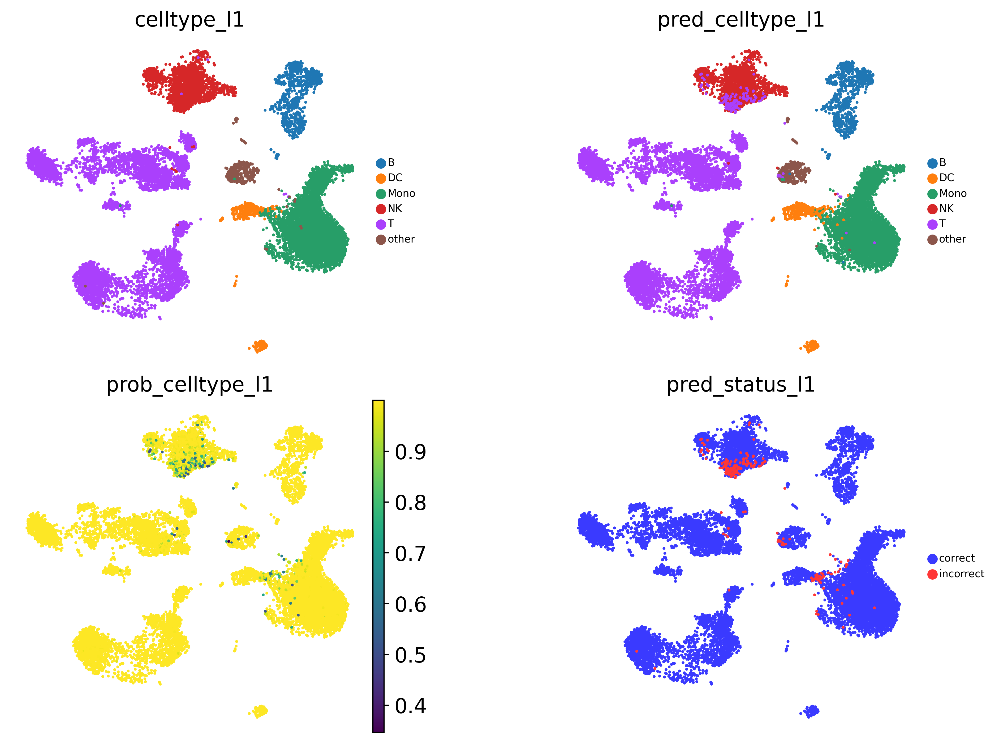

In [42]:
# Visualise predicted cell types levels, prediction probabilities and prediction status
sc.set_figure_params(dpi = 200, dpi_save=600)
adata_test_7 = adata_test_7[adata_test_7.obs['pred_status_l1'].sort_values().index,:]
sc.pl.embedding(adata_test_7, 
                color=[
                    'celltype_l1',
                    'pred_celltype_l1',
                    'prob_celltype_l1',
                    'pred_status_l1'
                ],
                sort_order = False,
                basis = 'X_umap',
                frameon = False,
                add_outline = False,
                legend_loc = 'right margin',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=2,
                s = 15,
                wspace = 0.4, 
                hspace = 0.1,
                save = '_PBMC_celltype_l1_scAdam_tuned.png')

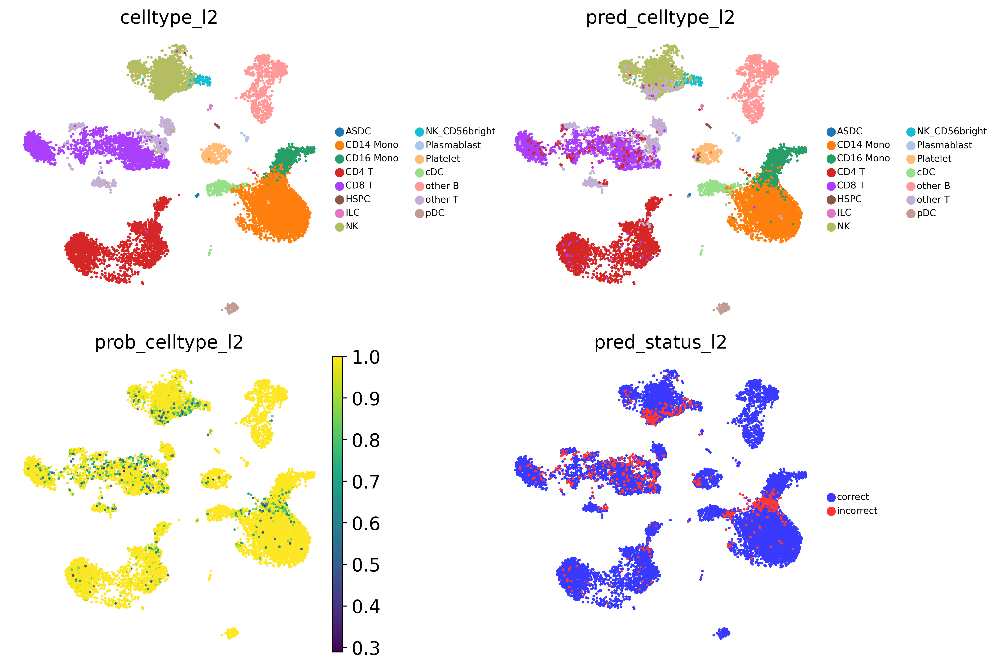

In [43]:
# Visualise predicted cell types levels, prediction probabilities and prediction status
sc.set_figure_params(dpi = 200, dpi_save=600)
adata_test_7 = adata_test_7[adata_test_7.obs['pred_status_l2'].sort_values().index,:]
sc.pl.embedding(adata_test_7, 
                color=[
                    'celltype_l2',
                    'pred_celltype_l2',
                    'prob_celltype_l2',
                    'pred_status_l2'
                ],
                sort_order = False,
                basis = 'X_umap',
                frameon = False,
                add_outline = False,
                legend_loc = 'right margin',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=2,
                s = 15,
                wspace = 0.4, 
                hspace = 0.1,
                save = '_PBMC_celltype_l2_scAdam_tuned.png')

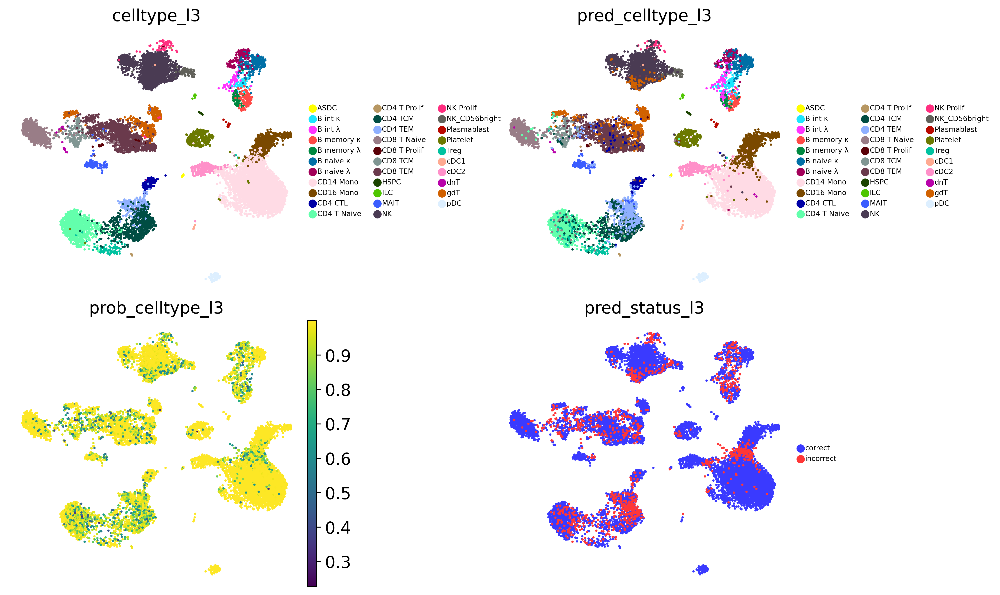

In [47]:
# Visualise predicted cell types levels, prediction probabilities and prediction status
sc.set_figure_params(dpi = 200, dpi_save=600)
adata_test_7 = adata_test_7[adata_test_7.obs['pred_status_l3'].sort_values().index,:]
sc.pl.embedding(adata_test_7, 
                color=[
                    'celltype_l3',
                    'pred_celltype_l3',
                    'prob_celltype_l3',
                    'pred_status_l3'
                ],
                sort_order = False,
                basis = 'X_umap',
                frameon = False,
                add_outline = False,
                legend_loc = 'right margin',
                legend_fontsize = 6,
                legend_fontoutline = 1,
                ncols=2,
                s = 15,
                wspace = 0.5, 
                hspace = 0.1,
                save = '_PBMC_celltype_l3_scAdam_tuned.png')

In [30]:
import session_info
session_info.show()

In [53]:
# Train scadam model using adata_balanced dataset
scparadise.scadam.train(adata_train_1,
                        path = '',
                        model_name = 'model_PBMC_scAdam_imbalanced',
                        celltype_l1 = 'celltype_l1',
                        celltype_l2 = 'celltype_l2',
                        celltype_l3 = 'celltype_l3',
                        eval_metric = ['accuracy'])

Successfully saved genes names for training model

Successfully saved dictionary of dataset annotations

Train dataset contains: 26794 cells, it is 90.0 % of input dataset
Test dataset contains: 2978 cells, it is 10.0 % of input dataset

Accelerator: cuda
Training unsupervised model
epoch 0  | loss: 81.9243 | val_0_unsup_loss_numpy: 1.3734899759292603|  0:00:01s
epoch 1  | loss: 1.49961 | val_0_unsup_loss_numpy: 1.0247900485992432|  0:00:03s
epoch 2  | loss: 1.06317 | val_0_unsup_loss_numpy: 0.971780002117157|  0:00:04s
epoch 3  | loss: 0.96007 | val_0_unsup_loss_numpy: 0.9124299883842468|  0:00:05s
epoch 4  | loss: 0.91742 | val_0_unsup_loss_numpy: 0.9042699933052063|  0:00:07s
epoch 5  | loss: 0.90965 | val_0_unsup_loss_numpy: 0.9009299874305725|  0:00:09s
epoch 6  | loss: 0.90192 | val_0_unsup_loss_numpy: 0.8975800275802612|  0:00:10s
epoch 7  | loss: 0.89609 | val_0_unsup_loss_numpy: 0.8811600208282471|  0:00:11s
epoch 8  | loss: 0.88359 | val_0_unsup_loss_numpy: 0.8692600131034851

In [56]:
# Predict cell types using trained model
for adata_test, j in zip(lst_test_adatas, lst_test_folders):
    os.makedirs(os.path.join('PBMC_3p_CITE/scadam_imbalanced', j))
    adata_test = scparadise.scadam.predict(adata_test, 
                                           path_model = 'model_PBMC_scAdam_imbalanced')
    df_default_l1 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l1',
                                                       pred_celltype='pred_celltype_l1',
                                                       report_name='report_test_scadam_imbalanced_' + 'celltype_l1' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_imbalanced', j).replace("\\","/"),
                                                       save_report = True)
    
    df_default_l2 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l2',
                                                       pred_celltype='pred_celltype_l2',
                                                       report_name='report_test_scadam_imbalanced_' + 'celltype_l2' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_imbalanced', j).replace("\\","/"),
                                                       save_report = True)
    
    df_default_l3 = scparadise.scnoah.report_classif_full(adata_test,
                                                       celltype='celltype_l3',
                                                       pred_celltype='pred_celltype_l3',
                                                       report_name='report_test_scadam_imbalanced_' + 'celltype_l3' + '.csv',
                                                       save_path = os.path.join('PBMC_3p_CITE/scadam_imbalanced', j).replace("\\","/"),
                                                       save_report = True)

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities
Successfully saved report

Successfully saved report

Successfully saved report

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities
Successfully saved report

Successfully saved report

Successfully saved report

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

S